# Urban Sounds Classifier

This dataset contains 8732 labeled sound excerpts (<=4s) of urban sounds from 10 classes: air_conditioner, car_horn, children_playing, dog_bark, drilling, enginge_idling, gun_shot, jackhammer, siren, and street_music.

In this project, we are looking to create a deep learning supervised multiclass classification model to successfully classify common sounds of an urban environment. This can be useful in home security systems, where sounds can be identified and classified as burglary sounds (such as glass or door breaking, gunshot, etc), and common urban sounds (such as a car horn or ambulance siren).



In [1]:
import librosa
import librosa.display
import IPython.display as ipd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation

Using TensorFlow backend.
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(

In [4]:
labels = pd.read_csv('Data/train.csv')
labels.head()

,ID,Class
0,0,siren
1,1,street_music
2,2,drilling
3,3,siren
4,4,dog_bark


<AxesSubplot:xlabel='Class'>

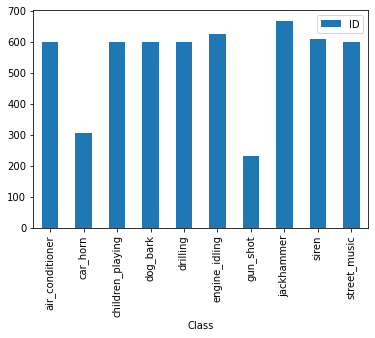

In [7]:
labels.groupby('Class').count().plot(kind='bar')
plt.show()

Our classes are somewhat balanced, except for `car_horn` and `gun_shot`. 

Let's create a new DataFrame called `data` where we will be adding all the features, including audio_name:

In [22]:
data = labels.copy()
data['audio_name'] = data.ID.apply(lambda x:f'Data/Train/{x}.wav')
data.head()

,ID,Class,audio_name
0,0,siren,Data/Train/0.wav
1,1,street_music,Data/Train/1.wav
2,2,drilling,Data/Train/2.wav
3,3,siren,Data/Train/3.wav
4,4,dog_bark,Data/Train/4.wav


Now, let us plot Waveforms and Spectogram for a random sample of each class, just to get an idea of what we are working with:

Class: air_conditioner


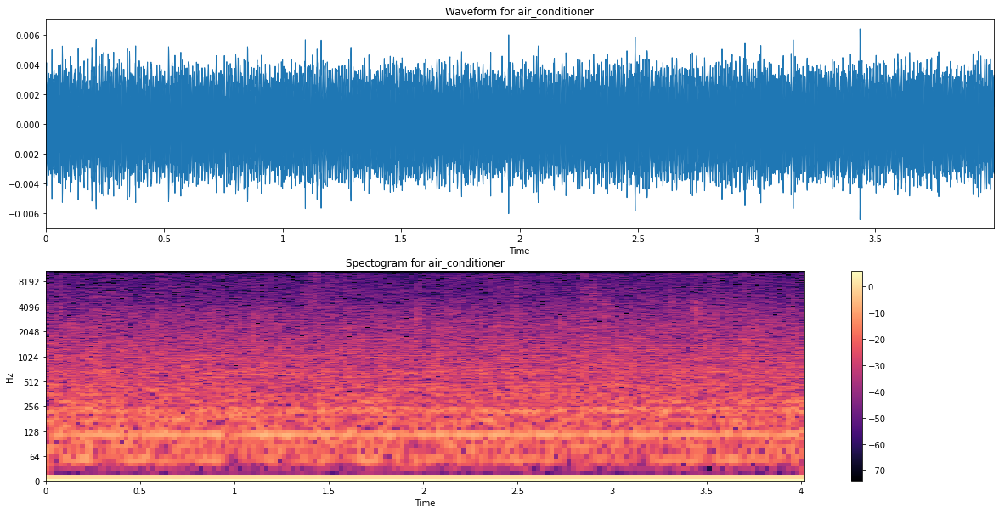

Class: car_horn


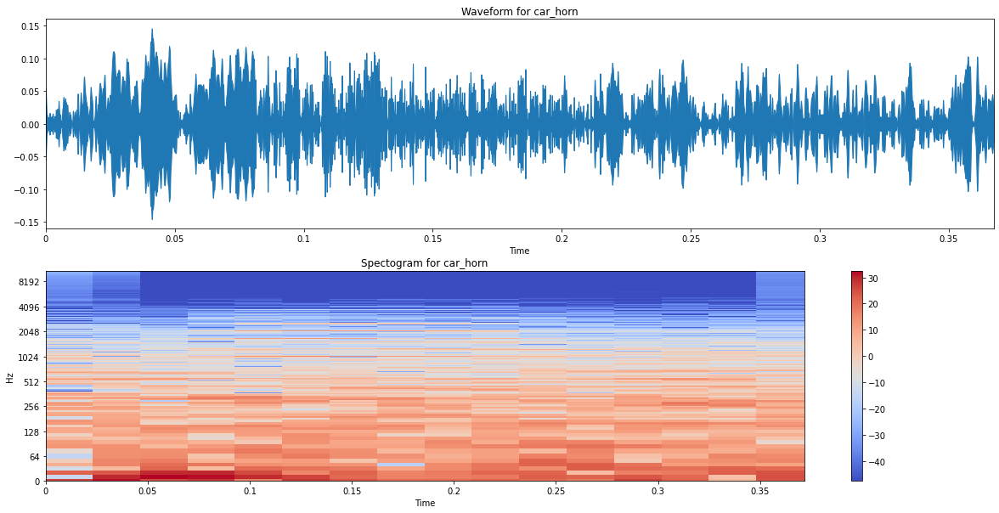

Class: children_playing


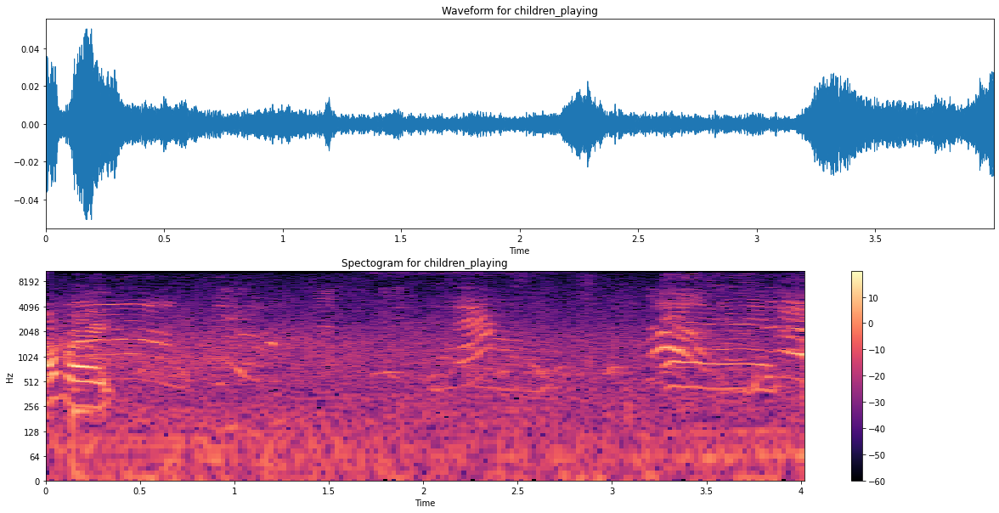

Class: dog_bark


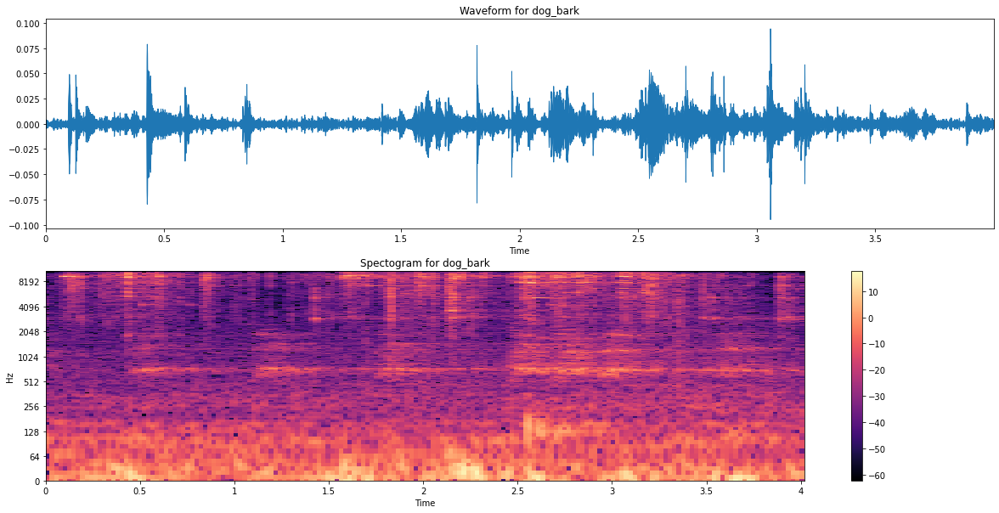

Class: drilling


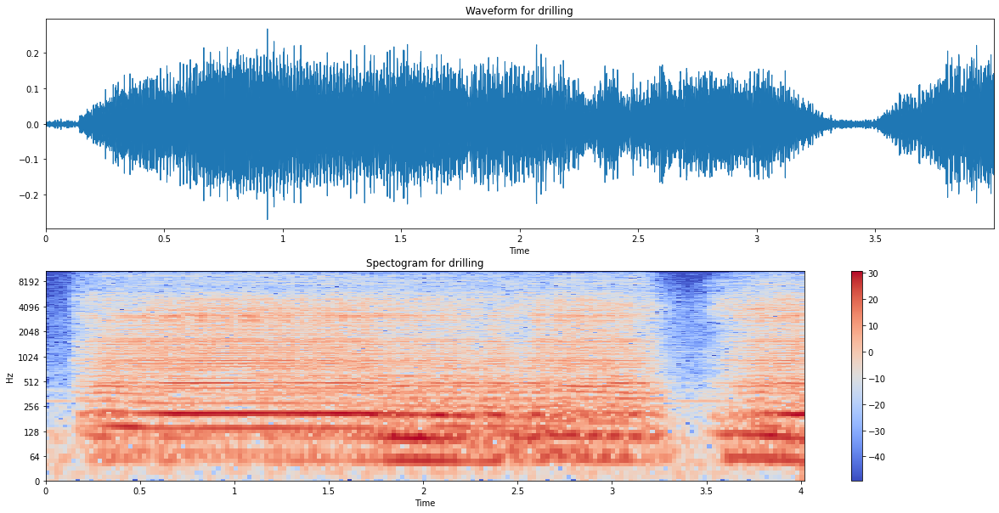

Class: engine_idling


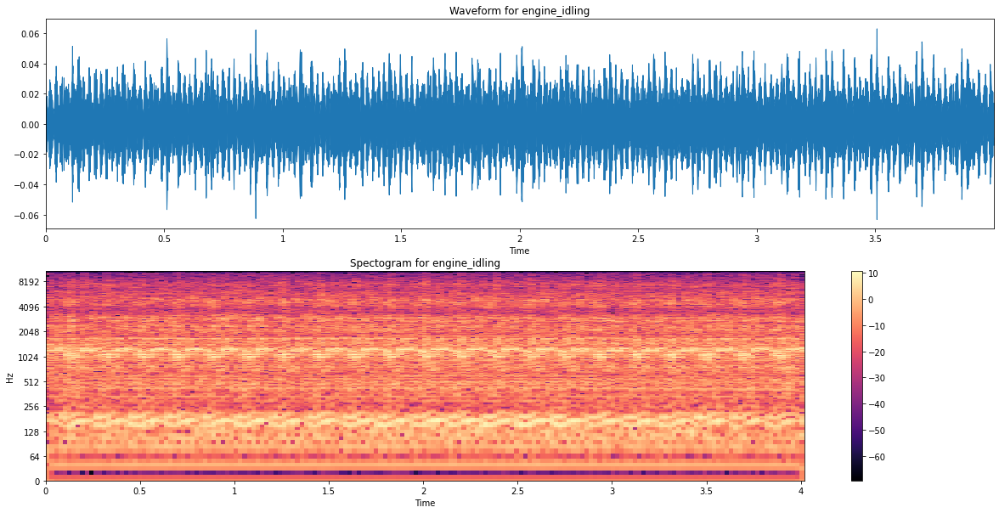

Class: gun_shot


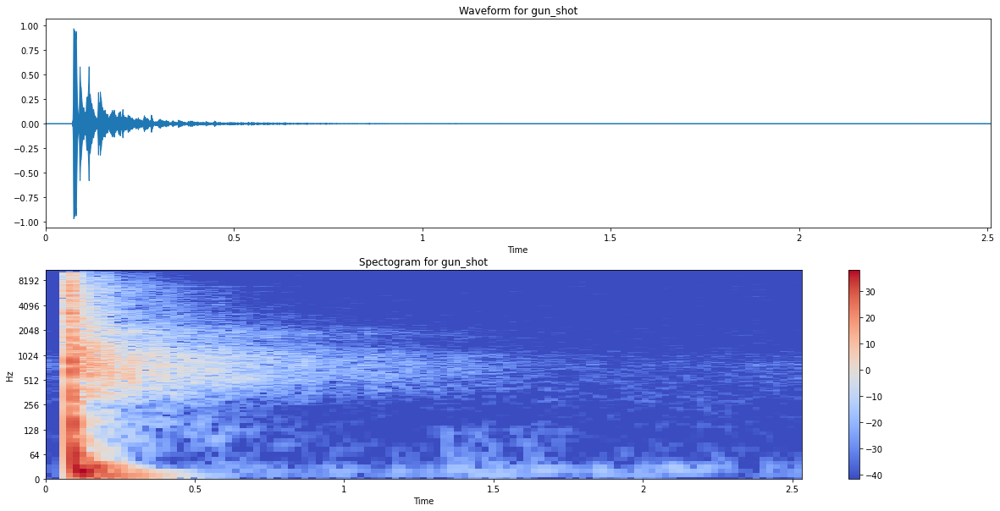

Class: jackhammer


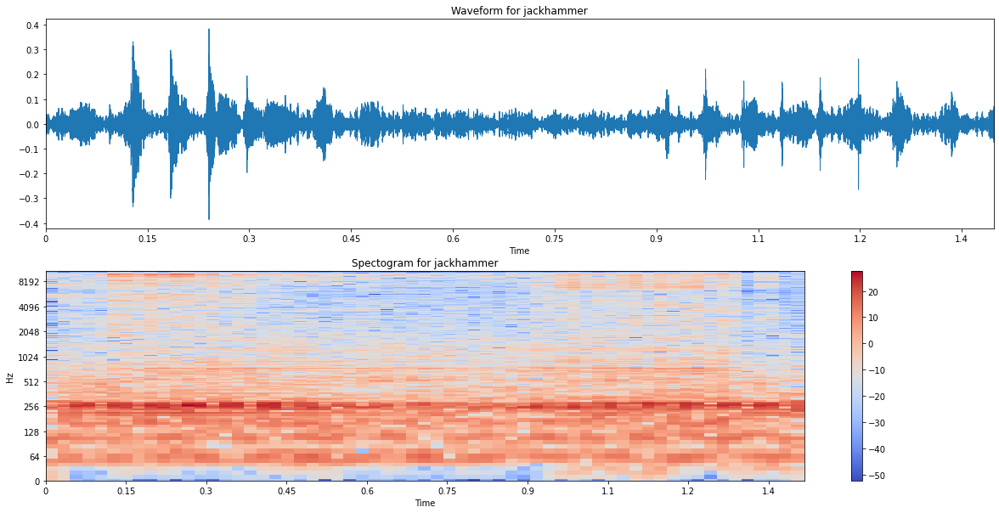

Class: siren


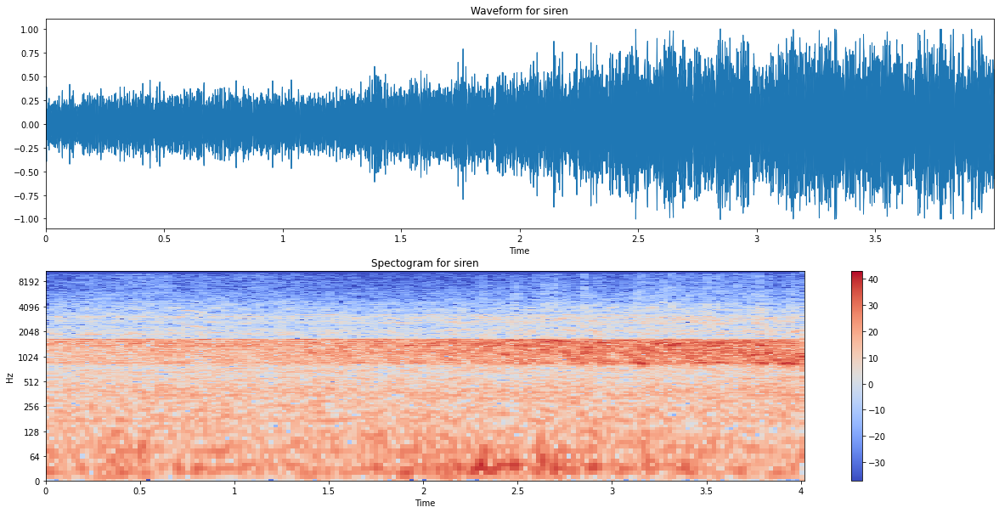

Class: street_music


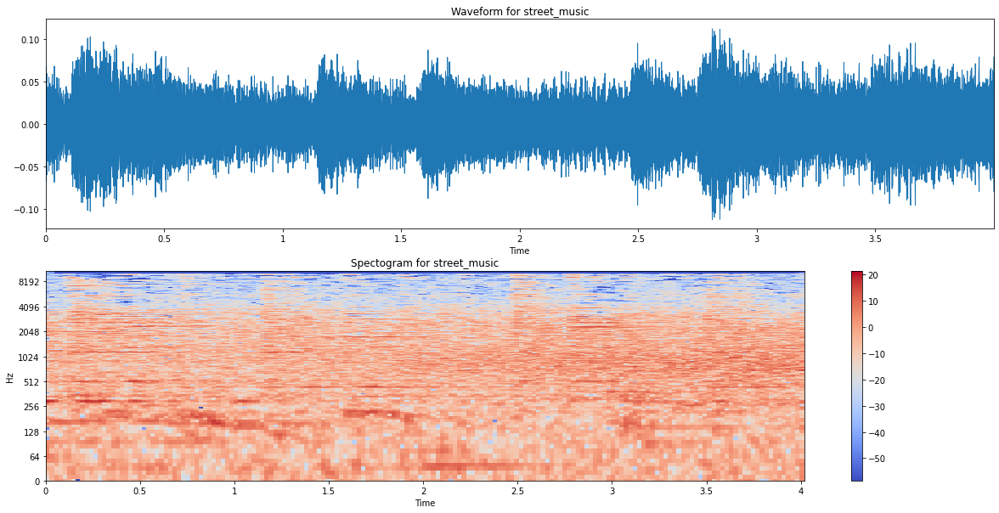

In [87]:
for index, row in data.groupby('Class').apply(lambda x: x.sample(1,random_state=2)).loc[:,['Class','audio_name']].iterrows():
    print('Class:',row[0])
    ipd.display(ipd.Audio(row[1]))
    x , sr = librosa.load(row[1])
    plt.figure(figsize=(20, 10))
    plt.subplot(211)
    librosa.display.waveplot(x, sr=sr)
    plt.title(f'Waveform for {row[0]}')
    X = librosa.stft(x)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.subplot(212)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.title(f'Spectogram for {row[0]}')
    plt.colorbar()
    plt.show()

Here we can see that, while some sounds follow a unique pattern (gun_shot), others are more sensitive to noise, making their waveform look very similar.

# Feature Extraction
- zcr: measures how many times the signal crosses 0
- tonnetz: Computes the tonal centroid features
- melspectrogram: Compute a Mel-scaled power spectrogram
- mfcc: Mel-frequency cepstral coefficients
- chorma_stft: Compute a chromagram from a waveform or power spectrogram
- spectral_contrast: Compute spectral contrast
- spectral_centroid: Indicates at which frequency the energy of a spectrum is centered upon
- spectral_rolloff: Represents the frequency at which high frequencies decline to 0
- spectral_bandwidth: Rhe width of the band of light at one-half the peak maximum

In [142]:
id_to_delete=[]
for index, row in data.iterrows():
    try:
        x , sr = librosa.load(row[2])
        #Zero Crossing Rate
        data.loc[index,'zcr'] = librosa.zero_crossings(x).mean()
        #Tonal Centroid Features
        tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(x),sr=sr), axis=1)
        data.loc[index,'fifth_x'] = tonnetz[0]
        data.loc[index,'fifth_y'] = tonnetz[1]
        data.loc[index,'minor_x'] = tonnetz[2]
        data.loc[index,'minor_y'] = tonnetz[3]
        data.loc[index,'major_x'] = tonnetz[4]
        data.loc[index,'major_y'] = tonnetz[5]
        #Mel-scaled Power Spectrogram
        mels = np.mean(librosa.feature.melspectrogram(x, sr=sr),axis=1)
        for i, mel in enumerate(mels):
            data.loc[index,f'melspectrogram_{i}'] = mel
        #Mel-frequency cepstral coefficients
        mfccs = np.mean(librosa.feature.mfcc(x, sr=sr),axis=1)
        for i, mfcc in enumerate(mfccs):
            data.loc[index,f'mfcc_{i}'] = mfcc
        #Chromagram
        s = np.abs(librosa.stft(x))
        chromas = np.mean(librosa.feature.chroma_stft(S=s, sr=sr),axis=1)
        for i, chroma in enumerate(chromas):
            data.loc[index,f'chroma_stft_{i}'] = chroma
        #Spectral Contrast
        contrats =  np.mean(librosa.feature.spectral_contrast(S=s, sr=sr),axis=1)
        for i, contrast in enumerate(chromas):
            data.loc[index,f'spectral_contrast_{i}'] = contrast
        #Spectral Centroid
        data.loc[index,'spectral_centroid'] = np.mean(librosa.feature.spectral_centroid(x, sr=sr)[0])
        #Spectral Rolloff
        data.loc[index,'spectral_rolloff'] = np.mean(librosa.feature.spectral_rolloff(x, sr=sr)[0])
        #Spectral Bandwidth
        data.loc[index,'spectral_badwidth'] = np.mean(librosa.feature.spectral_bandwidth(x, sr=sr))
        print('Audio ID',row[0],'done')
    except: 
        id_to_delete.append(row[0])
        print('Audio ID',row[0],'is not long enough')

Audio ID 0 done
Audio ID 1 done
Audio ID 2 done
Audio ID 3 done
Audio ID 4 done
Audio ID 6 done
Audio ID 10 done
Audio ID 11 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=785
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=393
  n_fft, y.shape[-1]


Audio ID 12 done
Audio ID 15 done
Audio ID 17 done
Audio ID 18 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\pitch.py:153: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn("Trying to estimate tuning from empty frequency set.")
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=675
  n_fft, y.shape[-1]


Audio ID 19 done
Audio ID 20 done
Audio ID 22 done
Audio ID 24 done
Audio ID 26 done
Audio ID 27 done
Audio ID 32 done
Audio ID 33 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=953
  n_fft, y.shape[-1]


Audio ID 35 done
Audio ID 36 done
Audio ID 37 done
Audio ID 38 done
Audio ID 40 done
Audio ID 42 done
Audio ID 43 done
Audio ID 44 done
Audio ID 45 done
Audio ID 46 done
Audio ID 47 done
Audio ID 48 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=989
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=495
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=248
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=124
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=62
  n_fft, y.s

Audio ID 49 done
Audio ID 50 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1000
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=500
  n_fft, y.shape[-1]


Audio ID 52 done
Audio ID 54 done
Audio ID 56 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=727
  n_fft, y.shape[-1]


Audio ID 57 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=792
  n_fft, y.shape[-1]


Audio ID 59 done
Audio ID 60 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=887
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=444
  n_fft, y.shape[-1]


Audio ID 61 done
Audio ID 63 done
Audio ID 65 done
Audio ID 66 done
Audio ID 67 done
Audio ID 68 done
Audio ID 71 done
Audio ID 72 done
Audio ID 74 done
Audio ID 76 done
Audio ID 77 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=524
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=262
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=131
  n_fft, y.shape[-1]


Audio ID 78 done
Audio ID 79 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=907
  n_fft, y.shape[-1]


Audio ID 80 done
Audio ID 81 done
Audio ID 82 done
Audio ID 83 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=585
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=293
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=147
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=74
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=37
  n_fft, y.sh

Audio ID 84 done
Audio ID 87 done
Audio ID 88 done
Audio ID 90 done
Audio ID 91 done
Audio ID 92 done
Audio ID 93 done
Audio ID 97 done
Audio ID 99 done
Audio ID 100 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=793
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=397
  n_fft, y.shape[-1]


Audio ID 101 done
Audio ID 103 done
Audio ID 104 done
Audio ID 105 done
Audio ID 113 done
Audio ID 114 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=643
  n_fft, y.shape[-1]


Audio ID 116 done
Audio ID 117 done
Audio ID 118 done
Audio ID 119 done
Audio ID 120 done
Audio ID 121 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=734
  n_fft, y.shape[-1]


Audio ID 123 done
Audio ID 125 done
Audio ID 128 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=752
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=376
  n_fft, y.shape[-1]


Audio ID 130 done
Audio ID 131 done
Audio ID 132 done
Audio ID 134 done
Audio ID 135 done
Audio ID 136 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=866
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=433
  n_fft, y.shape[-1]


Audio ID 137 done
Audio ID 138 done
Audio ID 139 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=634
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=317
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=159
  n_fft, y.shape[-1]


Audio ID 140 done
Audio ID 142 done
Audio ID 146 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=976
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=488
  n_fft, y.shape[-1]


Audio ID 148 done
Audio ID 149 done
Audio ID 152 done
Audio ID 153 done
Audio ID 159 done
Audio ID 160 done
Audio ID 162 done
Audio ID 163 done
Audio ID 164 done
Audio ID 165 done
Audio ID 167 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=754
  n_fft, y.shape[-1]


Audio ID 168 done
Audio ID 170 done
Audio ID 171 done
Audio ID 172 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1013
  n_fft, y.shape[-1]


Audio ID 174 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=917
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=459
  n_fft, y.shape[-1]


Audio ID 175 done
Audio ID 176 done
Audio ID 178 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=545
  n_fft, y.shape[-1]


Audio ID 179 done
Audio ID 182 done
Audio ID 184 done
Audio ID 185 done
Audio ID 186 done
Audio ID 187 done
Audio ID 188 done
Audio ID 189 done
Audio ID 192 done
Audio ID 193 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=586
  n_fft, y.shape[-1]


Audio ID 196 done
Audio ID 197 done
Audio ID 200 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=882
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=441
  n_fft, y.shape[-1]


Audio ID 202 done
Audio ID 208 done
Audio ID 211 done
Audio ID 212 done
Audio ID 213 done
Audio ID 214 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=955
  n_fft, y.shape[-1]


Audio ID 215 done
Audio ID 216 done
Audio ID 217 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=827
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=414
  n_fft, y.shape[-1]


Audio ID 218 done
Audio ID 219 done
Audio ID 221 done
Audio ID 222 done
Audio ID 223 done
Audio ID 224 done
Audio ID 226 done
Audio ID 227 done
Audio ID 228 done
Audio ID 229 done
Audio ID 230 done
Audio ID 232 done
Audio ID 233 done
Audio ID 235 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=800
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=400
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=200
  n_fft, y.shape[-1]


Audio ID 236 done
Audio ID 239 done
Audio ID 242 done
Audio ID 245 done
Audio ID 246 done
Audio ID 247 done
Audio ID 248 done
Audio ID 249 done
Audio ID 250 done
Audio ID 251 done
Audio ID 252 done
Audio ID 253 done
Audio ID 255 done
Audio ID 258 done
Audio ID 260 done
Audio ID 261 done
Audio ID 263 done
Audio ID 264 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=552
  n_fft, y.shape[-1]


Audio ID 268 done
Audio ID 269 done
Audio ID 270 done
Audio ID 271 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=861
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=431
  n_fft, y.shape[-1]


Audio ID 272 done
Audio ID 275 done
Audio ID 276 done
Audio ID 277 done
Audio ID 278 done
Audio ID 280 done
Audio ID 282 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=845
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=423
  n_fft, y.shape[-1]


Audio ID 285 done
Audio ID 286 done
Audio ID 288 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=742
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=371
  n_fft, y.shape[-1]


Audio ID 295 done
Audio ID 299 done
Audio ID 300 is not long enough


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1103
  n_fft, y.shape[-1]


Audio ID 301 done
Audio ID 303 done
Audio ID 304 done
Audio ID 305 done
Audio ID 306 done
Audio ID 307 done
Audio ID 308 done
Audio ID 309 done
Audio ID 310 done
Audio ID 311 done
Audio ID 312 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=864
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=432
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=216
  n_fft, y.shape[-1]


Audio ID 313 done
Audio ID 314 done
Audio ID 315 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=682
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=341
  n_fft, y.shape[-1]


Audio ID 316 done
Audio ID 317 done
Audio ID 318 done
Audio ID 319 done
Audio ID 322 done
Audio ID 323 done
Audio ID 324 done
Audio ID 326 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=655
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=328
  n_fft, y.shape[-1]


Audio ID 327 done
Audio ID 328 done
Audio ID 329 done
Audio ID 330 done
Audio ID 331 done
Audio ID 332 done
Audio ID 333 done
Audio ID 334 done
Audio ID 335 done
Audio ID 336 done
Audio ID 337 done
Audio ID 338 done
Audio ID 339 done
Audio ID 342 done
Audio ID 343 done
Audio ID 346 done
Audio ID 347 done
Audio ID 348 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=799
  n_fft, y.shape[-1]


Audio ID 349 done
Audio ID 350 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=721
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=361
  n_fft, y.shape[-1]


Audio ID 351 done
Audio ID 352 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=972
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=486
  n_fft, y.shape[-1]


Audio ID 353 done
Audio ID 354 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=778
  n_fft, y.shape[-1]


Audio ID 355 done
Audio ID 356 done
Audio ID 357 done
Audio ID 358 done
Audio ID 359 done
Audio ID 360 done
Audio ID 361 done
Audio ID 363 done
Audio ID 364 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=938
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=469
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=235
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=118
  n_fft, y.shape[-1]


Audio ID 365 done
Audio ID 366 done
Audio ID 367 done
Audio ID 368 done
Audio ID 369 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=610
  n_fft, y.shape[-1]


Audio ID 370 done
Audio ID 371 done
Audio ID 372 done
Audio ID 374 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=765
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=383
  n_fft, y.shape[-1]


Audio ID 376 done
Audio ID 377 done
Audio ID 378 done
Audio ID 380 done
Audio ID 381 done
Audio ID 382 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=631
  n_fft, y.shape[-1]


Audio ID 383 done
Audio ID 385 done
Audio ID 386 done
Audio ID 388 done
Audio ID 391 done
Audio ID 392 done
Audio ID 394 done
Audio ID 395 done
Audio ID 396 done
Audio ID 397 done
Audio ID 400 done
Audio ID 401 done
Audio ID 402 done
Audio ID 406 done
Audio ID 407 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=624
  n_fft, y.shape[-1]


Audio ID 408 done
Audio ID 410 done
Audio ID 411 done
Audio ID 412 done
Audio ID 413 done
Audio ID 414 done
Audio ID 417 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=846
  n_fft, y.shape[-1]


Audio ID 418 done
Audio ID 419 done
Audio ID 423 done
Audio ID 425 done
Audio ID 426 done
Audio ID 427 done
Audio ID 428 done
Audio ID 429 done
Audio ID 430 done
Audio ID 435 done
Audio ID 436 done
Audio ID 437 done
Audio ID 438 done
Audio ID 440 done
Audio ID 442 done
Audio ID 444 done
Audio ID 445 done
Audio ID 446 done
Audio ID 447 done
Audio ID 449 done
Audio ID 450 done
Audio ID 452 done
Audio ID 453 done
Audio ID 454 done
Audio ID 455 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=993
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=497
  n_fft, y.shape[-1]


Audio ID 456 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=517
  n_fft, y.shape[-1]


Audio ID 457 done
Audio ID 459 done
Audio ID 461 done
Audio ID 462 done
Audio ID 464 done
Audio ID 467 done
Audio ID 468 done
Audio ID 470 done
Audio ID 471 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=784
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=392
  n_fft, y.shape[-1]


Audio ID 472 done
Audio ID 473 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=745
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=373
  n_fft, y.shape[-1]


Audio ID 474 done
Audio ID 475 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=566
  n_fft, y.shape[-1]


Audio ID 477 done
Audio ID 479 done
Audio ID 480 done
Audio ID 482 done
Audio ID 484 done
Audio ID 485 done
Audio ID 486 done
Audio ID 488 done
Audio ID 489 done
Audio ID 491 done
Audio ID 493 done
Audio ID 495 done
Audio ID 497 done
Audio ID 498 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=646
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=323
  n_fft, y.shape[-1]


Audio ID 500 done
Audio ID 501 done
Audio ID 506 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=708
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=354
  n_fft, y.shape[-1]


Audio ID 507 done
Audio ID 509 done
Audio ID 511 done
Audio ID 512 done
Audio ID 513 done
Audio ID 515 done
Audio ID 516 done
Audio ID 519 done
Audio ID 520 done
Audio ID 522 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=692
  n_fft, y.shape[-1]


Audio ID 523 done
Audio ID 524 done
Audio ID 525 done
Audio ID 527 done
Audio ID 528 done
Audio ID 532 done
Audio ID 533 done
Audio ID 534 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=818
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=409
  n_fft, y.shape[-1]


Audio ID 537 done
Audio ID 538 done
Audio ID 540 done
Audio ID 542 done
Audio ID 543 done
Audio ID 544 done
Audio ID 547 done
Audio ID 549 done
Audio ID 551 done
Audio ID 554 done
Audio ID 555 done
Audio ID 556 done
Audio ID 557 done
Audio ID 559 done
Audio ID 560 done
Audio ID 561 done
Audio ID 562 done
Audio ID 564 done
Audio ID 565 done
Audio ID 566 done
Audio ID 567 done
Audio ID 568 done
Audio ID 569 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=872
  n_fft, y.shape[-1]


Audio ID 570 done
Audio ID 571 done
Audio ID 572 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=948
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=474
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=237
  n_fft, y.shape[-1]


Audio ID 573 done
Audio ID 575 done
Audio ID 576 done
Audio ID 578 done
Audio ID 579 done
Audio ID 580 done
Audio ID 583 done
Audio ID 584 done
Audio ID 585 done
Audio ID 586 done
Audio ID 587 done
Audio ID 589 done
Audio ID 590 done
Audio ID 593 done
Audio ID 594 done
Audio ID 597 done
Audio ID 598 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=741
  n_fft, y.shape[-1]


Audio ID 599 done
Audio ID 600 done
Audio ID 603 done
Audio ID 604 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=641
  n_fft, y.shape[-1]


Audio ID 605 done
Audio ID 606 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=896
  n_fft, y.shape[-1]


Audio ID 607 done
Audio ID 610 done
Audio ID 611 done
Audio ID 612 done
Audio ID 613 done
Audio ID 614 done
Audio ID 615 done
Audio ID 619 done
Audio ID 620 done
Audio ID 621 done
Audio ID 622 done
Audio ID 623 done
Audio ID 624 done
Audio ID 629 done
Audio ID 630 done
Audio ID 631 done
Audio ID 633 done
Audio ID 635 done
Audio ID 636 done
Audio ID 639 done
Audio ID 642 done
Audio ID 643 done
Audio ID 645 done
Audio ID 646 done
Audio ID 648 done
Audio ID 651 done
Audio ID 652 done
Audio ID 654 done
Audio ID 655 done
Audio ID 656 done
Audio ID 657 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=854
  n_fft, y.shape[-1]


Audio ID 658 done
Audio ID 659 done
Audio ID 660 done
Audio ID 661 done
Audio ID 662 done
Audio ID 663 done
Audio ID 664 done
Audio ID 665 done
Audio ID 666 done
Audio ID 669 done
Audio ID 670 done
Audio ID 671 done
Audio ID 673 done
Audio ID 676 done
Audio ID 677 done
Audio ID 679 done
Audio ID 683 done
Audio ID 684 done
Audio ID 685 done
Audio ID 686 done
Audio ID 687 done
Audio ID 688 done
Audio ID 689 done
Audio ID 690 done
Audio ID 691 done
Audio ID 692 done
Audio ID 693 done
Audio ID 694 done
Audio ID 695 done
Audio ID 697 done
Audio ID 698 done
Audio ID 699 done
Audio ID 702 done
Audio ID 703 done
Audio ID 704 done
Audio ID 705 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=600
  n_fft, y.shape[-1]


Audio ID 709 done
Audio ID 710 done
Audio ID 712 done
Audio ID 713 done
Audio ID 714 done
Audio ID 716 done
Audio ID 717 done
Audio ID 719 done
Audio ID 720 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=840
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=420
  n_fft, y.shape[-1]


Audio ID 721 done
Audio ID 722 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=810
  n_fft, y.shape[-1]


Audio ID 724 done
Audio ID 726 done
Audio ID 727 done
Audio ID 728 done
Audio ID 729 done
Audio ID 730 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=998
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=499
  n_fft, y.shape[-1]


Audio ID 732 done
Audio ID 733 done
Audio ID 734 done
Audio ID 735 done
Audio ID 737 done
Audio ID 738 done
Audio ID 739 done
Audio ID 740 done
Audio ID 742 done
Audio ID 744 done
Audio ID 746 done
Audio ID 748 done
Audio ID 749 done
Audio ID 750 done
Audio ID 751 done
Audio ID 752 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=855
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=428
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=214
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=107
  n_fft, y.shape[-1]


Audio ID 753 done
Audio ID 754 done
Audio ID 755 done
Audio ID 757 done
Audio ID 758 done
Audio ID 760 done
Audio ID 761 done
Audio ID 764 done
Audio ID 765 done
Audio ID 766 done
Audio ID 770 done
Audio ID 771 done
Audio ID 772 done
Audio ID 773 done
Audio ID 776 done
Audio ID 778 done
Audio ID 780 done
Audio ID 783 done
Audio ID 784 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=738
  n_fft, y.shape[-1]


Audio ID 785 done
Audio ID 787 done
Audio ID 790 done
Audio ID 791 done
Audio ID 792 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=867
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=434
  n_fft, y.shape[-1]


Audio ID 794 done
Audio ID 796 done
Audio ID 798 done
Audio ID 799 done
Audio ID 801 done
Audio ID 802 done
Audio ID 803 done
Audio ID 804 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=795
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=398
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=199
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=695
  n_fft, y.shape[-1]


Audio ID 807 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=758
  n_fft, y.shape[-1]


Audio ID 809 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=672
  n_fft, y.shape[-1]


Audio ID 810 done
Audio ID 811 done
Audio ID 812 done
Audio ID 813 done
Audio ID 816 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=554
  n_fft, y.shape[-1]


Audio ID 817 done
Audio ID 819 done
Audio ID 820 done
Audio ID 821 done
Audio ID 824 done
Audio ID 825 done
Audio ID 826 done
Audio ID 829 done
Audio ID 830 done
Audio ID 832 done
Audio ID 833 done
Audio ID 834 done
Audio ID 835 done
Audio ID 838 done
Audio ID 839 done
Audio ID 840 done
Audio ID 841 done
Audio ID 843 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=900
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=450
  n_fft, y.shape[-1]


Audio ID 844 done
Audio ID 845 done
Audio ID 848 done
Audio ID 849 done
Audio ID 850 done
Audio ID 851 done
Audio ID 853 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=834
  n_fft, y.shape[-1]


Audio ID 854 done
Audio ID 855 done
Audio ID 857 done
Audio ID 858 done
Audio ID 859 done
Audio ID 860 done
Audio ID 863 done
Audio ID 864 done
Audio ID 865 done
Audio ID 867 done
Audio ID 868 done
Audio ID 869 done
Audio ID 870 done
Audio ID 871 done
Audio ID 872 done
Audio ID 874 done
Audio ID 875 done
Audio ID 876 done
Audio ID 878 done
Audio ID 881 done
Audio ID 882 done
Audio ID 883 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=794
  n_fft, y.shape[-1]


Audio ID 884 done
Audio ID 885 done
Audio ID 886 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=841
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=421
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=211
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1004
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=502
  n_fft, y

Audio ID 887 done
Audio ID 889 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=831
  n_fft, y.shape[-1]


Audio ID 891 done
Audio ID 892 done
Audio ID 893 done
Audio ID 894 done
Audio ID 896 done
Audio ID 898 done
Audio ID 899 done
Audio ID 900 done
Audio ID 901 done
Audio ID 904 done
Audio ID 905 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=893
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=447
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=224
  n_fft, y.shape[-1]


Audio ID 906 done
Audio ID 907 done
Audio ID 911 done
Audio ID 912 done
Audio ID 913 done
Audio ID 914 done
Audio ID 915 done
Audio ID 916 done
Audio ID 919 done
Audio ID 921 done
Audio ID 922 done
Audio ID 923 done
Audio ID 925 done
Audio ID 926 done
Audio ID 927 done
Audio ID 928 done
Audio ID 929 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=712
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=356
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=178
  n_fft, y.shape[-1]


Audio ID 930 done
Audio ID 932 done
Audio ID 933 done
Audio ID 937 done
Audio ID 938 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=722
  n_fft, y.shape[-1]


Audio ID 941 done
Audio ID 943 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=736
  n_fft, y.shape[-1]


Audio ID 945 done
Audio ID 946 done
Audio ID 948 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=507
  n_fft, y.shape[-1]


Audio ID 951 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=731
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=366
  n_fft, y.shape[-1]


Audio ID 952 done
Audio ID 953 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=519
  n_fft, y.shape[-1]


Audio ID 954 done
Audio ID 955 done
Audio ID 956 done
Audio ID 957 done
Audio ID 959 done
Audio ID 963 done
Audio ID 964 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=876
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=438
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=219
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=110
  n_fft, y.shape[-1]


Audio ID 965 done
Audio ID 971 done
Audio ID 972 done
Audio ID 973 done
Audio ID 975 done
Audio ID 977 done
Audio ID 978 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=577
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=289
  n_fft, y.shape[-1]


Audio ID 979 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=874
  n_fft, y.shape[-1]


Audio ID 980 done
Audio ID 985 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=666
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=333
  n_fft, y.shape[-1]


Audio ID 986 done
Audio ID 987 done
Audio ID 990 done
Audio ID 991 done
Audio ID 995 done
Audio ID 996 done
Audio ID 1000 done
Audio ID 1001 done
Audio ID 1003 done
Audio ID 1004 done
Audio ID 1006 done
Audio ID 1007 done
Audio ID 

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1009
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=505
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=253
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=127
  n_fft, y.shape[-1]


1008 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=862
  n_fft, y.shape[-1]


Audio ID 1014 done
Audio ID 1015 done
Audio ID 1017 done
Audio ID 1018 done
Audio ID 1021 done
Audio ID 1022 done
Audio ID 1024 done
Audio ID 1025 done
Audio ID 1026 done
Audio ID 1027 done
Audio ID 1028 done
Audio ID 1029 done
Audio ID 1030 done
Audio ID 1032 done
Audio ID 1034 done
Audio ID 1036 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=975
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=244
  n_fft, y.shape[-1]


Audio ID 1038 done
Audio ID 1040 done
Audio ID 1042 done
Audio ID 1043 done
Audio ID 1044 done
Audio ID 1045 done
Audio ID 1047 done
Audio ID 1048 done
Audio ID 1049 done
Audio ID 1051 done
Audio ID 1052 done
Audio ID 1054 done
Audio ID 1055 done
Audio ID 1056 done
Audio ID 1058 done
Audio ID 1059 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=186
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=93
  n_fft, y.shape[-1]


Audio ID 1061 done
Audio ID 1062 done
Audio ID 1063 done
Audio ID 1066 done
Audio ID 1068 done
Audio ID 1069 done
Audio ID 1070 done
Audio ID 1071 done
Audio ID 1072 done
Audio ID 1074 done
Audio ID 1076 done
Audio ID 1077 done
Audio ID 1078 done
Audio ID 1079 done
Audio ID 1080 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=569
  n_fft, y.shape[-1]


Audio ID 1082 done
Audio ID 1083 done
Audio ID 1085 done
Audio ID 1087 done
Audio ID 1088 done
Audio ID 1089 done
Audio ID 1090 done
Audio ID 1091 done
Audio ID 1092 done
Audio ID 1096 done
Audio ID 1098 done
Audio ID 1100 done
Audio ID 1105 done
Audio ID 1106 done
Audio ID 1112 done
Audio ID 1113 done
Audio ID 1115 done
Audio ID 1116 done
Audio ID 1118 done
Audio ID 1119 done
Audio ID 1120 done
Audio ID 1126 done
Audio ID 1129 done
Audio ID 1131 done
Audio ID 1133 done
Audio ID 1134 done
Audio ID 1137 done
Audio ID 1139 done
Audio ID 1143 done
Audio ID 1145 done
Audio ID 1147 done
Audio ID 1148 done
Audio ID 1149 done
Audio ID 1150 done
Audio ID 1151 done
Audio ID 1152 done
Audio ID 1156 done
Audio ID 1157 done
Audio ID 1158 done
Audio ID 1160 done
Audio ID 1162 done
Audio ID 1168 done
Audio ID 1174 done
Audio ID 1175 done
Audio ID 1176 done
Audio ID 1180 done
Audio ID 1181 done
Audio ID 1182 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1323
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=662
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=331
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=166
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=83
  n_fft, y.

Audio ID 1183 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=910
  n_fft, y.shape[-1]


Audio ID 1186 done
Audio ID 1187 done
Audio ID 1188 done
Audio ID 1189 done
Audio ID 1191 done
Audio ID 1195 done
Audio ID 1200 done
Audio ID 1203 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=389
  n_fft, y.shape[-1]


Audio ID 1205 done
Audio ID 1206 done
Audio ID 1209 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=927
  n_fft, y.shape[-1]


Audio ID 1210 done
Audio ID 1214 done
Audio ID 1217 done
Audio ID 1218 done
Audio ID 1219 done
Audio ID 1220 done
Audio ID 1224 done
Audio ID 1226 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=951
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=476
  n_fft, y.shape[-1]


Audio ID 1228 done
Audio ID 1230 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=943
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=472
  n_fft, y.shape[-1]


Audio ID 1231 done
Audio ID 1232 done
Audio ID 1235 done
Audio ID 1236 done
Audio ID 1237 done
Audio ID 1240 done
Audio ID 1241 done
Audio ID 1242 done
Audio ID 1243 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=66
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=786
  n_fft, y.shape[-1]


Audio ID 1244 done
Audio ID 1245 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=728
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=364
  n_fft, y.shape[-1]


Audio ID 1246 done
Audio ID 1248 done
Audio ID 1251 done
Audio ID 1252 done
Audio ID 1255 done
Audio ID 1256 done
Audio ID 1257 done
Audio ID 1259 done
Audio ID 1261 done
Audio ID 1262 done
Audio ID 1265 done
Audio ID 1267 done
Audio ID 1269 done
Audio ID 1270 done
Audio ID 1271 done
Audio ID 1272 done
Audio ID 1273 done
Audio ID 1275 done
Audio ID 1276 done
Audio ID 1277 done
Audio ID 1278 done
Audio ID 1279 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=710
  n_fft, y.shape[-1]


Audio ID 1286 done
Audio ID 1287 done
Audio ID 1289 done
Audio ID 1292 done
Audio ID 1294 done
Audio ID 1295 done
Audio ID 1296 done
Audio ID 1297 done
Audio ID 1298 done
Audio ID 1300 done
Audio ID 1301 done
Audio ID 1302 done
Audio ID 1303 done
Audio ID 1305 done
Audio ID 1306 done
Audio ID 1308 done
Audio ID 1310 done
Audio ID 1311 done
Audio ID 1312 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1007
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=504
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=252
  n_fft, y.shape[-1]


Audio ID 1314 done
Audio ID 1316 done
Audio ID 1317 done
Audio ID 1318 done
Audio ID 1319 done
Audio ID 1321 done
Audio ID 1322 done
Audio ID 1323 done
Audio ID 1326 done
Audio ID 1327 done
Audio ID 1328 done
Audio ID 1329 done
Audio ID 1330 done
Audio ID 1332 done
Audio ID 1334 done
Audio ID 1335 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=595
  n_fft, y.shape[-1]


Audio ID 1337 done
Audio ID 1338 done
Audio ID 1339 done
Audio ID 1341 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=623
  n_fft, y.shape[-1]


Audio ID 1345 done
Audio ID 1346 done
Audio ID 1347 done
Audio ID 1349 done
Audio ID 1350 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=183
  n_fft, y.shape[-1]


Audio ID 1351 done
Audio ID 1352 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=276
  n_fft, y.shape[-1]


Audio ID 1353 done
Audio ID 1355 done
Audio ID 1356 done
Audio ID 1357 done
Audio ID 1358 done
Audio ID 1361 done
Audio ID 1363 done
Audio ID 1365 done
Audio ID 1366 done
Audio ID 1367 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=931
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=466
  n_fft, y.shape[-1]


Audio ID 1368 done
Audio ID 1370 done
Audio ID 1371 done
Audio ID 1377 done
Audio ID 1378 done
Audio ID 1380 done
Audio ID 1381 done
Audio ID 1384 done
Audio ID 1385 done
Audio ID 1386 done
Audio ID 1388 done
Audio ID 1390 done
Audio ID 1393 done
Audio ID 1394 done
Audio ID 1396 done
Audio ID 1398 done
Audio ID 1399 done
Audio ID 1400 done
Audio ID 1404 done
Audio ID 1405 done
Audio ID 1409 done
Audio ID 1412 done
Audio ID 1414 done
Audio ID 1415 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=892
  n_fft, y.shape[-1]


Audio ID 1417 done
Audio ID 1418 done
Audio ID 1419 done
Audio ID 1423 done
Audio ID 1425 done
Audio ID 1428 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=748
  n_fft, y.shape[-1]


Audio ID 1431 done
Audio ID 1432 done
Audio ID 1435 done
Audio ID 1436 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=514
  n_fft, y.shape[-1]


Audio ID 1437 done
Audio ID 1444 done
Audio ID 1446 done
Audio ID 1447 done
Audio ID 1448 done
Audio ID 1449 done
Audio ID 1450 done
Audio ID 1452 done
Audio ID 1454 done
Audio ID 1458 done
Audio ID 1459 done
Audio ID 1460 done
Audio ID 1461 done
Audio ID 1462 done
Audio ID 1467 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=238
  n_fft, y.shape[-1]


Audio ID 1468 done
Audio ID 1469 done
Audio ID 1470 done
Audio ID 1471 done
Audio ID 1472 done
Audio ID 1473 done
Audio ID 1475 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1017
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=509
  n_fft, y.shape[-1]


Audio ID 1477 done
Audio ID 1478 done
Audio ID 1479 done
Audio ID 1480 done
Audio ID 1481 done
Audio ID 1483 done
Audio ID 1485 done
Audio ID 1488 is not long enough


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=100
  n_fft, y.shape[-1]


Audio ID 1489 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=626
  n_fft, y.shape[-1]


Audio ID 1491 done
Audio ID 1492 done
Audio ID 1493 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=978
  n_fft, y.shape[-1]


Audio ID 1496 done
Audio ID 1497 done
Audio ID 1498 done
Audio ID 1500 done
Audio ID 1501 done
Audio ID 1502 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=576
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=288
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=144
  n_fft, y.shape[-1]


Audio ID 1503 done
Audio ID 1506 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=717
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=359
  n_fft, y.shape[-1]


Audio ID 1508 done
Audio ID 1510 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=572
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=286
  n_fft, y.shape[-1]


Audio ID 1511 done
Audio ID 1512 done
Audio ID 1515 done
Audio ID 1516 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=138
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=69
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=35
  n_fft, y.shape[-1]


Audio ID 1517 done
Audio ID 1518 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=676
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=338
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=169
  n_fft, y.shape[-1]


Audio ID 1520 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1020
  n_fft, y.shape[-1]


Audio ID 1521 done
Audio ID 1523 done
Audio ID 1525 done
Audio ID 1527 done
Audio ID 1528 done
Audio ID 1529 done
Audio ID 1530 done
Audio ID 1531 done
Audio ID 1532 done
Audio ID 1534 done
Audio ID 1536 done
Audio ID 1537 done
Audio ID 1540 done
Audio ID 1542 done
Audio ID 1546 done
Audio ID 1547 done
Audio ID 1548 done
Audio ID 1549 done
Audio ID 1550 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=579
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=290
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=145
  n_fft, y.shape[-1]


Audio ID 1551 done
Audio ID 1552 done
Audio ID 1554 done
Audio ID 1555 done
Audio ID 1556 done
Audio ID 1558 done
Audio ID 1560 done
Audio ID 1561 done
Audio ID 1562 done
Audio ID 1563 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=688
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=344
  n_fft, y.shape[-1]


Audio ID 1564 done
Audio ID 1565 done
Audio ID 1567 done
Audio ID 1569 done
Audio ID 1570 done
Audio ID 1571 done
Audio ID 1573 done
Audio ID 1574 done
Audio ID 1578 done
Audio ID 1579 done
Audio ID 1581 done
Audio ID 1584 done
Audio ID 1586 done
Audio ID 1588 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=965
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=483
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=242
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=121
  n_fft, y.shape[-1]


Audio ID 1589 done
Audio ID 1591 done
Audio ID 1593 done
Audio ID 1597 done
Audio ID 1598 done
Audio ID 1599 done
Audio ID 1601 done
Audio ID 1602 done
Audio ID 1603 done
Audio ID 1604 done
Audio ID 1605 done
Audio ID 1606 done
Audio ID 1607 done
Audio ID 1608 done
Audio ID 1612 done
Audio ID 1613 done
Audio ID 1614 done
Audio ID 1615 done
Audio ID 1616 done
Audio ID 1618 done
Audio ID 1621 done
Audio ID 1623 done
Audio ID 1626 done
Audio ID 1628 done
Audio ID 1629 done
Audio ID 1630 done
Audio ID 1632 done
Audio ID 1633 done
Audio ID 1634 done
Audio ID 1635 done
Audio ID 1636 done
Audio ID 1639 done
Audio ID 1640 done
Audio ID 1647 done
Audio ID 1648 done
Audio ID 1649 done
Audio ID 1651 done
Audio ID 1652 done
Audio ID 1653 done
Audio ID 1656 done
Audio ID 1660 done
Audio ID 1661 done
Audio ID 1663 done
Audio ID 1664 done
Audio ID 1666 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=603
  n_fft, y.shape[-1]


Audio ID 1667 done
Audio ID 1669 done
Audio ID 1672 done
Audio ID 1673 done
Audio ID 1674 done
Audio ID 1675 done
Audio ID 1677 done
Audio ID 1678 done
Audio ID 1679 done
Audio ID 1680 done
Audio ID 1681 done
Audio ID 1686 done
Audio ID 1687 done
Audio ID 1688 done
Audio ID 1689 done
Audio ID 1690 done
Audio ID 1695 done
Audio ID 1697 done
Audio ID 1699 done
Audio ID 1701 done
Audio ID 1702 done
Audio ID 1703 done
Audio ID 1704 done
Audio ID 1705 done
Audio ID 1706 done
Audio ID 1708 done
Audio ID 1709 done
Audio ID 1711 done
Audio ID 1713 done
Audio ID 1714 done
Audio ID 1715 done
Audio ID 1716 done
Audio ID 1718 done
Audio ID 1719 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=651
  n_fft, y.shape[-1]


Audio ID 1720 done
Audio ID 1722 done
Audio ID 1724 done
Audio ID 1725 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=979
  n_fft, y.shape[-1]


Audio ID 1727 done
Audio ID 1728 done
Audio ID 1729 done
Audio ID 1730 done
Audio ID 1731 done
Audio ID 1734 done
Audio ID 1736 done
Audio ID 1737 done
Audio ID 1738 done
Audio ID 1739 done
Audio ID 1741 done
Audio ID 1744 done
Audio ID 1745 done
Audio ID 1746 done
Audio ID 1748 done
Audio ID 1749 done
Audio ID 1750 done
Audio ID 1751 done
Audio ID 1754 done
Audio ID 1755 done
Audio ID 1760 done
Audio ID 1761 done
Audio ID 1763 done
Audio ID 1765 done
Audio ID 1766 done
Audio ID 1767 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=538
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=269
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=135
  n_fft, y.shape[-1]


Audio ID 1768 done
Audio ID 1769 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=571
  n_fft, y.shape[-1]


Audio ID 1771 done
Audio ID 1773 done
Audio ID 1774 done
Audio ID 1776 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=197
  n_fft, y.shape[-1]


Audio ID 1777 done
Audio ID 1779 done
Audio ID 1780 done
Audio ID 1782 done
Audio ID 1783 done
Audio ID 1786 done
Audio ID 1787 done
Audio ID 1789 done
Audio ID 1791 done
Audio ID 1792 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=762
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=381
  n_fft, y.shape[-1]


Audio ID 1794 done
Audio ID 1795 done
Audio ID 1796 done
Audio ID 1800 done
Audio ID 1801 done
Audio ID 1802 done
Audio ID 1803 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=860
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=430
  n_fft, y.shape[-1]


Audio ID 1805 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=850
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=425
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=213
  n_fft, y.shape[-1]


Audio ID 1806 done
Audio ID 1807 done
Audio ID 1808 done
Audio ID 1809 done
Audio ID 1812 done
Audio ID 1813 done
Audio ID 1816 done
Audio ID 1817 done
Audio ID 1818 done
Audio ID 1819 done
Audio ID 1820 done
Audio ID 1822 done
Audio ID 1825 done
Audio ID 1826 done
Audio ID 1827 done
Audio ID 1828 done
Audio ID 1829 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=714
  n_fft, y.shape[-1]


Audio ID 1830 done
Audio ID 1831 done
Audio ID 1832 done
Audio ID 1834 done
Audio ID 1836 done
Audio ID 1837 done
Audio ID 1839 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=814
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=407
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=204
  n_fft, y.shape[-1]


Audio ID 1840 done
Audio ID 1841 done
Audio ID 1842 done
Audio ID 1843 done
Audio ID 1847 done
Audio ID 1848 done
Audio ID 1849 done
Audio ID 1850 done
Audio ID 1853 done
Audio ID 1854 done
Audio ID 1856 done
Audio ID 1858 done
Audio ID 1863 done
Audio ID 1864 done
Audio ID 1866 done
Audio ID 1867 done
Audio ID 1868 done
Audio ID 1869 done
Audio ID 1870 done
Audio ID 1871 done
Audio ID 1872 done
Audio ID 1873 done
Audio ID 1874 done
Audio ID 1876 done
Audio ID 1877 done
Audio ID 1879 done
Audio ID 1881 done
Audio ID 1883 done
Audio ID 1886 done
Audio ID 1889 done
Audio ID 1890 done
Audio ID 1891 done
Audio ID 1892 done
Audio ID 1893 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=921
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=461
  n_fft, y.shape[-1]


Audio ID 1894 done
Audio ID 1895 done
Audio ID 1896 done
Audio ID 1897 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=761
  n_fft, y.shape[-1]


Audio ID 1898 done
Audio ID 1899 done
Audio ID 1901 done
Audio ID 1904 done
Audio ID 1908 done
Audio ID 1910 done
Audio ID 1913 done
Audio ID 1914 done
Audio ID 1916 done
Audio ID 1917 done
Audio ID 1918 done
Audio ID 1919 done
Audio ID 1921 done
Audio ID 1922 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=903
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=452
  n_fft, y.shape[-1]


Audio ID 1923 done
Audio ID 1924 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=257
  n_fft, y.shape[-1]


Audio ID 1925 done
Audio ID 1927 done
Audio ID 1929 done
Audio ID 1932 done
Audio ID 1933 done
Audio ID 1935 done
Audio ID 1936 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=563
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=282
  n_fft, y.shape[-1]


Audio ID 1937 done
Audio ID 1938 done
Audio ID 1940 done
Audio ID 1941 done
Audio ID 1943 done
Audio ID 1944 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=798
  n_fft, y.shape[-1]


Audio ID 1945 done
Audio ID 1946 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=207
  n_fft, y.shape[-1]


Audio ID 1947 done
Audio ID 1948 done
Audio ID 1949 done
Audio ID 1950 done
Audio ID 1952 done
Audio ID 1956 done
Audio ID 1957 done
Audio ID 1958 done
Audio ID 1960 done
Audio ID 1963 done
Audio ID 1966 done
Audio ID 1967 done
Audio ID 1968 done
Audio ID 1970 done
Audio ID 1971 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=516
  n_fft, y.shape[-1]


Audio ID 1973 done
Audio ID 1974 done
Audio ID 1976 done
Audio ID 1977 done
Audio ID 1978 done
Audio ID 1980 done
Audio ID 1982 done
Audio ID 1986 done
Audio ID 1987 done
Audio ID 1988 done
Audio ID 1991 done
Audio ID 1992 done
Audio ID 1994 done
Audio ID 1996 done
Audio ID 1997 done
Audio ID 1999 done
Audio ID 2000 done
Audio ID 2001 done
Audio ID 2002 done
Audio ID 2004 done
Audio ID 2008 done
Audio ID 2009 done
Audio ID 2010 done
Audio ID 2013 done
Audio ID 2016 done
Audio ID 2017 done
Audio ID 2018 done
Audio ID 2019 done
Audio ID 2020 done
Audio ID 2022 done
Audio ID 2023 done
Audio ID 2025 done
Audio ID 2026 done
Audio ID 2028 done
Audio ID 2029 done
Audio ID 2031 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=669
  n_fft, y.shape[-1]


Audio ID 2033 done
Audio ID 2036 done
Audio ID 2037 done
Audio ID 2038 done
Audio ID 2040 done
Audio ID 2042 done
Audio ID 2043 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=313
  n_fft, y.shape[-1]


Audio ID 2045 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=417
  n_fft, y.shape[-1]


Audio ID 2047 done
Audio ID 2048 done
Audio ID 2049 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=885
  n_fft, y.shape[-1]


Audio ID 2050 done
Audio ID 2051 done
Audio ID 2054 done
Audio ID 2055 done
Audio ID 2056 done
Audio ID 2057 done
Audio ID 2063 done
Audio ID 2064 done
Audio ID 2066 done
Audio ID 2067 done
Audio ID 2070 done
Audio ID 2072 done
Audio ID 2073 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=958
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=479
  n_fft, y.shape[-1]


Audio ID 2077 done
Audio ID 2078 done
Audio ID 2080 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=605
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=303
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=152
  n_fft, y.shape[-1]


Audio ID 2081 done
Audio ID 2082 done
Audio ID 2083 done
Audio ID 2084 done
Audio ID 2087 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=987
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=494
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=247
  n_fft, y.shape[-1]


Audio ID 2089 done
Audio ID 2090 done
Audio ID 2091 done
Audio ID 2094 done
Audio ID 2095 done
Audio ID 2096 done
Audio ID 2098 done
Audio ID 2099 done
Audio ID 2101 done
Audio ID 2102 done
Audio ID 2103 done
Audio ID 2104 done
Audio ID 2105 done
Audio ID 2106 done
Audio ID 2107 done
Audio ID 2108 done
Audio ID 2113 done
Audio ID 2116 done
Audio ID 2117 done
Audio ID 2121 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=405
  n_fft, y.shape[-1]


Audio ID 2122 done
Audio ID 2123 done
Audio ID 2124 done
Audio ID 2125 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=812
  n_fft, y.shape[-1]


Audio ID 2126 done
Audio ID 2127 done
Audio ID 2129 done
Audio ID 2130 done
Audio ID 2132 done
Audio ID 2133 done
Audio ID 2134 done
Audio ID 2135 done
Audio ID 2138 done
Audio ID 2139 done
Audio ID 2140 done
Audio ID 2141 done
Audio ID 2142 done
Audio ID 2144 done
Audio ID 2145 done
Audio ID 2148 done
Audio ID 2149 done
Audio ID 2150 done
Audio ID 2152 done
Audio ID 2154 done
Audio ID 2156 done
Audio ID 2157 done
Audio ID 2160 done
Audio ID 2162 done
Audio ID 2163 done
Audio ID 2168 done
Audio ID 2169 done
Audio ID 2170 done
Audio ID 2171 done
Audio ID 2173 done
Audio ID 2174 done
Audio ID 2179 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=716
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=358
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=179
  n_fft, y.shape[-1]


Audio ID 2180 done
Audio ID 2182 done
Audio ID 2184 done
Audio ID 2185 done
Audio ID 2186 done
Audio ID 2188 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=599
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=300
  n_fft, y.shape[-1]


Audio ID 2190 done
Audio ID 2191 done
Audio ID 2192 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=510
  n_fft, y.shape[-1]


Audio ID 2193 done
Audio ID 2194 done
Audio ID 2195 done
Audio ID 2196 done
Audio ID 2197 done
Audio ID 2198 done
Audio ID 2199 done
Audio ID 2200 done
Audio ID 2201 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=650
  n_fft, y.shape[-1]


Audio ID 2204 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=743
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=372
  n_fft, y.shape[-1]


Audio ID 2205 done
Audio ID 2206 done
Audio ID 2209 done
Audio ID 2210 done
Audio ID 2212 done
Audio ID 2216 done
Audio ID 2217 done
Audio ID 2218 done
Audio ID 2219 done
Audio ID 2220 done
Audio ID 2224 done
Audio ID 2225 done
Audio ID 2226 done
Audio ID 2227 done
Audio ID 2228 done
Audio ID 2229 done
Audio ID 2230 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=767
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=384
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=192
  n_fft, y.shape[-1]


Audio ID 2233 done
Audio ID 2235 done
Audio ID 2236 done
Audio ID 2237 done
Audio ID 2238 done
Audio ID 2240 done
Audio ID 2241 done
Audio ID 2244 done
Audio ID 2246 done
Audio ID 2247 done
Audio ID 2249 done
Audio ID 2250 done
Audio ID 2251 done
Audio ID 2252 done
Audio ID 2253 done
Audio ID 2254 done
Audio ID 2256 done
Audio ID 2258 done
Audio ID 2259 done
Audio ID 2260 done
Audio ID 2262 done
Audio ID 2264 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=679
  n_fft, y.shape[-1]


Audio ID 2265 done
Audio ID 2269 done
Audio ID 2273 done
Audio ID 2275 done
Audio ID 2277 done
Audio ID 2278 done
Audio ID 2279 done
Audio ID 2282 done
Audio ID 2287 done
Audio ID 2290 done
Audio ID 2291 done
Audio ID 2293 done
Audio ID 2295 done
Audio ID 2297 done
Audio ID 2299 done
Audio ID 2300 done
Audio ID 2301 done
Audio ID 2302 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=760
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=380
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=190
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=95
  n_fft, y.shape[-1]


Audio ID 2303 done
Audio ID 2304 done
Audio ID 2306 done
Audio ID 2307 done
Audio ID 2308 done
Audio ID 2309 done
Audio ID 2310 done
Audio ID 2312 done
Audio ID 2313 done
Audio ID 2314 done
Audio ID 2318 done
Audio ID 2319 done
Audio ID 2323 done
Audio ID 2324 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=824
  n_fft, y.shape[-1]


Audio ID 2327 done
Audio ID 2329 done
Audio ID 2330 done
Audio ID 2332 done
Audio ID 2333 done
Audio ID 2335 done
Audio ID 2338 done
Audio ID 2339 done
Audio ID 2340 done
Audio ID 2343 done
Audio ID 2344 done
Audio ID 2345 done
Audio ID 2347 done
Audio ID 2349 done
Audio ID 2351 done
Audio ID 2353 done
Audio ID 2354 done
Audio ID 2358 done
Audio ID 2360 done
Audio ID 2363 done
Audio ID 2364 done
Audio ID 2366 done
Audio ID 2368 done
Audio ID 2369 done
Audio ID 2371 done
Audio ID 2372 done
Audio ID 2373 done
Audio ID 2378 done
Audio ID 2379 done
Audio ID 2380 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=104
  n_fft, y.shape[-1]


Audio ID 2382 done
Audio ID 2384 done
Audio ID 2386 done
Audio ID 2388 done
Audio ID 2389 done
Audio ID 2390 done
Audio ID 2394 done
Audio ID 2395 done
Audio ID 2398 done
Audio ID 2401 done
Audio ID 2402 done
Audio ID 2403 done
Audio ID 2404 done
Audio ID 2405 done
Audio ID 2408 done
Audio ID 2410 done
Audio ID 2411 done
Audio ID 2412 done
Audio ID 2413 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=683
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=342
  n_fft, y.shape[-1]


Audio ID 2414 done
Audio ID 2415 done
Audio ID 2416 done
Audio ID 2418 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=556
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=278
  n_fft, y.shape[-1]


Audio ID 2419 done
Audio ID 2420 done
Audio ID 2421 done
Audio ID 2424 done
Audio ID 2425 done
Audio ID 2427 done
Audio ID 2428 done
Audio ID 2430 done
Audio ID 2432 done
Audio ID 2433 done
Audio ID 2438 done
Audio ID 2439 done
Audio ID 2441 done
Audio ID 2443 done
Audio ID 2444 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=820
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=410
  n_fft, y.shape[-1]


Audio ID 2445 done
Audio ID 2446 done
Audio ID 2447 done
Audio ID 2448 done
Audio ID 2449 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=455
  n_fft, y.shape[-1]


Audio ID 2450 done
Audio ID 2452 done
Audio ID 2453 done
Audio ID 2454 done
Audio ID 2455 done
Audio ID 2456 done
Audio ID 2458 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1523
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=191
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=96
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=48
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=24
  n_fft, y.sh

Audio ID 2460 done
Audio ID 2461 done
Audio ID 2462 done
Audio ID 2463 done
Audio ID 2464 done
Audio ID 2465 done
Audio ID 2466 done
Audio ID 2468 done
Audio ID 2470 done
Audio ID 2473 done
Audio ID 2474 done
Audio ID 2477 done
Audio ID 2478 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=772
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=386
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=193
  n_fft, y.shape[-1]


Audio ID 2479 done
Audio ID 2480 done
Audio ID 2484 done
Audio ID 2485 done
Audio ID 2487 done
Audio ID 2488 done
Audio ID 2489 done
Audio ID 2493 done
Audio ID 2494 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=533
  n_fft, y.shape[-1]


Audio ID 2497 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=838
  n_fft, y.shape[-1]


Audio ID 2498 done
Audio ID 2499 done
Audio ID 2501 done
Audio ID 2503 done
Audio ID 2505 done
Audio ID 2506 done
Audio ID 2507 done
Audio ID 2509 done
Audio ID 2510 done
Audio ID 2511 done
Audio ID 2512 done
Audio ID 2513 done
Audio ID 2515 done
Audio ID 2516 done
Audio ID 2517 done
Audio ID 2523 done
Audio ID 2524 done
Audio ID 2526 done
Audio ID 2529 done
Audio ID 2531 done
Audio ID 2532 done
Audio ID 2534 done
Audio ID 2536 done
Audio ID 2538 done
Audio ID 2539 done
Audio ID 2541 done
Audio ID 2542 done
Audio ID 2543 done
Audio ID 2544 done
Audio ID 2545 done
Audio ID 2547 done
Audio ID 2548 done
Audio ID 2549 done
Audio ID 2550 done
Audio ID 2552 done
Audio ID 2553 done
Audio ID 2555 done
Audio ID 2557 done
Audio ID 2558 done
Audio ID 2560 done
Audio ID 2564 done
Audio ID 2567 done
Audio ID 2568 done
Audio ID 2569 done
Audio ID 2570 done
Audio ID 2571 done
Audio ID 2572 done
Audio ID 2573 done
Audio ID 2574 done
Audio ID 2575 done
Audio ID 2576 done
Audio ID 2577 done
Audio ID 257

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=816
  n_fft, y.shape[-1]


Audio ID 2607 done
Audio ID 2608 done
Audio ID 2610 done
Audio ID 2612 done
Audio ID 2613 done
Audio ID 2614 done
Audio ID 2616 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=902
  n_fft, y.shape[-1]


Audio ID 2619 done
Audio ID 2620 done
Audio ID 2623 done
Audio ID 2624 done
Audio ID 2625 done
Audio ID 2632 done
Audio ID 2634 done
Audio ID 2636 done
Audio ID 2637 done
Audio ID 2639 done
Audio ID 2640 done
Audio ID 2641 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=597
  n_fft, y.shape[-1]


Audio ID 2644 done
Audio ID 2645 done
Audio ID 2646 done
Audio ID 2647 done
Audio ID 2648 done
Audio ID 2650 done
Audio ID 2651 done
Audio ID 2652 done
Audio ID 2653 done
Audio ID 2657 done
Audio ID 2658 done
Audio ID 2659 done
Audio ID 2661 done
Audio ID 2662 done
Audio ID 2664 done
Audio ID 2665 done
Audio ID 2666 done
Audio ID 2668 done
Audio ID 2669 done
Audio ID 2671 done
Audio ID 2674 done
Audio ID 2676 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=700
  n_fft, y.shape[-1]


Audio ID 2677 done
Audio ID 2678 done
Audio ID 2679 done
Audio ID 2680 done
Audio ID 2682 done
Audio ID 2684 done
Audio ID 2685 done
Audio ID 2686 done
Audio ID 2687 done
Audio ID 2689 done
Audio ID 2690 done
Audio ID 2691 done
Audio ID 2695 done
Audio ID 2697 done
Audio ID 2699 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=848
  n_fft, y.shape[-1]


Audio ID 2700 done
Audio ID 2702 done
Audio ID 2703 done
Audio ID 2705 done
Audio ID 2706 done
Audio ID 2707 done
Audio ID 2709 done
Audio ID 2710 done
Audio ID 2711 done
Audio ID 2713 done
Audio ID 2714 done
Audio ID 2717 done
Audio ID 2718 done
Audio ID 2721 done
Audio ID 2722 done
Audio ID 2723 done
Audio ID 2725 done
Audio ID 2726 done
Audio ID 2728 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=696
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=348
  n_fft, y.shape[-1]


Audio ID 2730 done
Audio ID 2732 done
Audio ID 2733 done
Audio ID 2736 done
Audio ID 2738 done
Audio ID 2739 done
Audio ID 2740 done
Audio ID 2741 done
Audio ID 2744 done
Audio ID 2746 done
Audio ID 

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=249
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=125
  n_fft, y.shape[-1]


2747 done
Audio ID 2750 done
Audio ID 2751 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=172
  n_fft, y.shape[-1]


Audio ID 2752 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=180
  n_fft, y.shape[-1]


Audio ID 2754 done
Audio ID 2756 done
Audio ID 2757 done
Audio ID 2760 done
Audio ID 2763 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=819
  n_fft, y.shape[-1]


Audio ID 2764 done
Audio ID 2765 done
Audio ID 2766 done
Audio ID 2769 done
Audio ID 2770 done
Audio ID 2771 done
Audio ID 2773 done
Audio ID 2774 done
Audio ID 2775 done
Audio ID 2776 done
Audio ID 2779 done
Audio ID 2780 done
Audio ID 2781 done
Audio ID 2783 done
Audio ID 2784 done
Audio ID 2785 done
Audio ID 2787 done
Audio ID 2788 done
Audio ID 2789 done
Audio ID 2790 done
Audio ID 2791 done
Audio ID 2792 done
Audio ID 2794 done
Audio ID 2795 done
Audio ID 2797 done
Audio ID 2800 done
Audio ID 2801 done
Audio ID 2802 done
Audio ID 2805 done
Audio ID 2807 done
Audio ID 2808 done
Audio ID 2811 done
Audio ID 2813 done
Audio ID 2815 done
Audio ID 2819 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=932
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=233
  n_fft, y.shape[-1]


Audio ID 2821 done
Audio ID 2824 done
Audio ID 2825 done
Audio ID 2828 done
Audio ID 2829 done
Audio ID 2830 done
Audio ID 2831 done
Audio ID 2832 done
Audio ID 2835 done
Audio ID 2836 done
Audio ID 2837 done
Audio ID 2840 done
Audio ID 2842 done
Audio ID 2846 done
Audio ID 2849 done
Audio ID 2850 done
Audio ID 2851 done
Audio ID 2854 done
Audio ID 2855 done
Audio ID 2857 done
Audio ID 2858 done
Audio ID 2862 done
Audio ID 2863 done
Audio ID 2864 done
Audio ID 2865 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=703
  n_fft, y.shape[-1]


Audio ID 2869 done
Audio ID 2870 done
Audio ID 2871 done
Audio ID 2872 done
Audio ID 2873 done
Audio ID 2875 done
Audio ID 2878 done
Audio ID 2881 done
Audio ID 2884 done
Audio ID 2887 done
Audio ID 2889 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=715
  n_fft, y.shape[-1]


Audio ID 2890 done
Audio ID 2891 done
Audio ID 2892 done
Audio ID 2896 done
Audio ID 2898 done
Audio ID 2899 done
Audio ID 2900 done
Audio ID 2901 done
Audio ID 2902 done
Audio ID 2903 done
Audio ID 2907 done
Audio ID 2909 done
Audio ID 2910 done
Audio ID 2911 done
Audio ID 2912 done
Audio ID 2913 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=924
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=462
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=231
  n_fft, y.shape[-1]


Audio ID 2914 done
Audio ID 2915 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=424
  n_fft, y.shape[-1]


Audio ID 2917 done
Audio ID 2918 done
Audio ID 2920 done
Audio ID 2921 done
Audio ID 2922 done
Audio ID 2924 done
Audio ID 2925 done
Audio ID 2926 done
Audio ID 2927 done
Audio ID 2928 done
Audio ID 2929 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=355
  n_fft, y.shape[-1]


Audio ID 2930 done
Audio ID 2931 done
Audio ID 2932 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=652
  n_fft, y.shape[-1]


Audio ID 2933 done
Audio ID 2934 done
Audio ID 

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=80
  n_fft, y.shape[-1]


2935 done
Audio ID 2936 done
Audio ID 2939 done
Audio ID 2940 done
Audio ID 2942 done
Audio ID 2943 done
Audio ID 2944 done
Audio ID 2945 done
Audio ID 2946 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=416
  n_fft, y.shape[-1]


Audio ID 2950 done
Audio ID 2951 done
Audio ID 2954 done
Audio ID 2955 done
Audio ID 2956 done
Audio ID 2957 done
Audio ID 2959 done
Audio ID 2960 done
Audio ID 2961 done
Audio ID 2962 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=621
  n_fft, y.shape[-1]


Audio ID 2963 done
Audio ID 2966 done
Audio ID 2969 done
Audio ID 2971 done
Audio ID 2972 done
Audio ID 2974 done
Audio ID 2976 done
Audio ID 2980 done
Audio ID 2982 done
Audio ID 2983 done
Audio ID 2984 done
Audio ID 2986 done
Audio ID 2987 done
Audio ID 2988 done
Audio ID 2989 done
Audio ID 2991 done
Audio ID 2992 done
Audio ID 2993 done
Audio ID 2994 done
Audio ID 2995 done
Audio ID 2996 done
Audio ID 2997 done
Audio ID 2998 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=674
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=337
  n_fft, y.shape[-1]


Audio ID 3001 done
Audio ID 3003 done
Audio ID 3004 done
Audio ID 3006 done
Audio ID 3008 done
Audio ID 3011 done
Audio ID 3012 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=565
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=283
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=142
  n_fft, y.shape[-1]


Audio ID 3013 done
Audio ID 3014 done
Audio ID 3016 done
Audio ID 3018 done
Audio ID 3020 done
Audio ID 3021 done
Audio ID 3024 done
Audio ID 3026 done
Audio ID 3027 done
Audio ID 3030 done
Audio ID 3032 done
Audio ID 3033 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=606
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=76
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=38
  n_fft, y.shape[-1]


Audio ID 3034 done
Audio ID 3036 done
Audio ID 3037 done
Audio ID 3038 done
Audio ID 3042 done
Audio ID 3046 done
Audio ID 3050 done
Audio ID 3051 done
Audio ID 3052 done
Audio ID 3054 done
Audio ID 3055 done
Audio ID 3056 done
Audio ID 3060 done
Audio ID 3061 done
Audio ID 3062 done
Audio ID 3063 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1023
  n_fft, y.shape[-1]


Audio ID 3066 done
Audio ID 3068 done
Audio ID 3069 done
Audio ID 3070 done
Audio ID 3071 done
Audio ID 3074 done
Audio ID 3075 done
Audio ID 3077 done
Audio ID 3078 done
Audio ID 3081 done
Audio ID 3082 done
Audio ID 3085 done
Audio ID 3087 done
Audio ID 3089 done
Audio ID 3091 done
Audio ID 3092 done
Audio ID 3094 done
Audio ID 3095 done
Audio ID 3096 done
Audio ID 3097 done
Audio ID 3098 done
Audio ID 3099 done
Audio ID 3101 done
Audio ID 3102 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=685
  n_fft, y.shape[-1]


Audio ID 3103 done
Audio ID 3104 done
Audio ID 3105 done
Audio ID 3108 done
Audio ID 3110 done
Audio ID 3112 done
Audio ID 3115 done
Audio ID 3117 done
Audio ID 3118 done
Audio ID 3120 done
Audio ID 3121 done
Audio ID 3123 done
Audio ID 3125 done
Audio ID 3126 done
Audio ID 3127 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=221
  n_fft, y.shape[-1]


Audio ID 3128 done
Audio ID 3130 done
Audio ID 3131 done
Audio ID 3133 done
Audio ID 3135 done
Audio ID 3136 done
Audio ID 3138 done
Audio ID 3140 done
Audio ID 3143 done
Audio ID 3144 done
Audio ID 3146 done
Audio ID 3147 done
Audio ID 3148 done
Audio ID 3150 done
Audio ID 3151 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=592
  n_fft, y.shape[-1]


Audio ID 3152 done
Audio ID 3153 done
Audio ID 3154 done
Audio ID 3155 done
Audio ID 3156 done
Audio ID 3157 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=558
  n_fft, y.shape[-1]


Audio ID 3159 done
Audio ID 3160 done
Audio ID 3161 done
Audio ID 3162 done
Audio ID 3163 done
Audio ID 3164 done
Audio ID 3165 done
Audio ID 3167 done
Audio ID 3168 done
Audio ID 3169 done
Audio ID 3170 done
Audio ID 3171 done
Audio ID 3172 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=986
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=493
  n_fft, y.shape[-1]


Audio ID 3176 done
Audio ID 3177 done
Audio ID 3178 done
Audio ID 3179 done
Audio ID 3180 done
Audio ID 3182 done
Audio ID 3185 done
Audio ID 3186 done
Audio ID 3187 done
Audio ID 3188 done
Audio ID 3189 done
Audio ID 3190 done
Audio ID 3191 done
Audio ID 3192 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=873
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=437
  n_fft, y.shape[-1]


Audio ID 3194 done
Audio ID 3195 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=660
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=330
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=165
  n_fft, y.shape[-1]


Audio ID 3196 done
Audio ID 3197 done
Audio ID 3199 done
Audio ID 3200 done
Audio ID 3202 done
Audio ID 3205 done
Audio ID 3206 done
Audio ID 3207 done
Audio ID 3209 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=255
  n_fft, y.shape[-1]


Audio ID 3211 done
Audio ID 3213 done
Audio ID 3214 done
Audio ID 3215 done
Audio ID 3216 done
Audio ID 3218 done
Audio ID 3220 done
Audio ID 3221 done
Audio ID 3223 done
Audio ID 3225 done
Audio ID 3226 done
Audio ID 3227 done
Audio ID 3229 done
Audio ID 3230 done
Audio ID 3231 done
Audio ID 3232 done
Audio ID 3233 done
Audio ID 3235 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=639
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=320
  n_fft, y.shape[-1]


Audio ID 3236 done
Audio ID 3237 done
Audio ID 3238 done
Audio ID 3239 done
Audio ID 3240 done
Audio ID 3244 done
Audio ID 3246 done
Audio ID 3248 done
Audio ID 3250 done
Audio ID 3254 done
Audio ID 3257 done
Audio ID 3258 done
Audio ID 3259 done
Audio ID 3261 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=489
  n_fft, y.shape[-1]


Audio ID 3262 done
Audio ID 3264 done
Audio ID 3266 done
Audio ID 3267 done
Audio ID 3268 done
Audio ID 3270 done
Audio ID 3271 done
Audio ID 3272 done
Audio ID 3273 done
Audio ID 3275 done
Audio ID 3276 done
Audio ID 3277 done
Audio ID 3278 done
Audio ID 3279 done
Audio ID 3281 done
Audio ID 3283 done
Audio ID 3285 done
Audio ID 3286 done
Audio ID 3288 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=379
  n_fft, y.shape[-1]


Audio ID 3291 done
Audio ID 3292 done
Audio ID 3293 done
Audio ID 3294 done
Audio ID 3296 done
Audio ID 3297 done
Audio ID 3298 done
Audio ID 3299 done
Audio ID 3301 done
Audio ID 3302 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=352
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=176
  n_fft, y.shape[-1]


Audio ID 3305 done
Audio ID 3306 done
Audio ID 3307 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=769
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=385
  n_fft, y.shape[-1]


Audio ID 3308 done
Audio ID 3310 done
Audio ID 3316 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=822
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=411
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=206
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=870
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=435
  n_fft, y.

Audio ID 3317 done
Audio ID 3318 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=109
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=55
  n_fft, y.shape[-1]


Audio ID 3319 done
Audio ID 3320 done
Audio ID 3321 done
Audio ID 3322 done
Audio ID 3323 done
Audio ID 3324 done
Audio ID 3325 done
Audio ID 3328 done
Audio ID 3330 done
Audio ID 3331 done
Audio ID 3332 done
Audio ID 3333 done
Audio ID 3334 done
Audio ID 3336 done
Audio ID 3337 done
Audio ID 3338 done
Audio ID 3343 done
Audio ID 3344 done
Audio ID 3345 done
Audio ID 3347 done
Audio ID 3349 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=357
  n_fft, y.shape[-1]


Audio ID 3350 done
Audio ID 3351 done
Audio ID 3352 done
Audio ID 3353 done
Audio ID 3354 done
Audio ID 3355 done
Audio ID 3357 done
Audio ID 3358 done
Audio ID 3360 done
Audio ID 3362 done
Audio ID 3363 done
Audio ID 3364 done
Audio ID 3365 done
Audio ID 3367 done
Audio ID 3369 done
Audio ID 3370 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=661
  n_fft, y.shape[-1]


Audio ID 3371 done
Audio ID 3373 done
Audio ID 3375 done
Audio ID 3376 done
Audio ID 3379 done
Audio ID 3381 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=802
  n_fft, y.shape[-1]


Audio ID 3383 done
Audio ID 3387 done
Audio ID 3388 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=611
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=306
  n_fft, y.shape[-1]


Audio ID 3389 done
Audio ID 3390 done
Audio ID 3392 done
Audio ID 3394 done
Audio ID 3395 done
Audio ID 3397 done
Audio ID 3398 done
Audio ID 3399 done
Audio ID 3400 done
Audio ID 3401 done
Audio ID 3404 done
Audio ID 3406 done
Audio ID 3407 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=968
  n_fft, y.shape[-1]


Audio ID 3409 done
Audio ID 3413 done
Audio ID 3415 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=521
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=261
  n_fft, y.shape[-1]


Audio ID 3416 done
Audio ID 3417 done
Audio ID 3418 done
Audio ID 3419 done
Audio ID 3420 done
Audio ID 3422 done
Audio ID 3423 done
Audio ID 3425 done
Audio ID 3429 done
Audio ID 3432 done
Audio ID 3433 done
Audio ID 3434 done
Audio ID 3435 done
Audio ID 3436 done
Audio ID 3437 done
Audio ID 3439 done
Audio ID 3441 done
Audio ID 3442 done
Audio ID 3443 done
Audio ID 3444 done
Audio ID 3445 done
Audio ID 3446 done
Audio ID 3449 done
Audio ID 3451 done
Audio ID 3452 done
Audio ID 3453 done
Audio ID 3454 done
Audio ID 3455 done
Audio ID 3458 done
Audio ID 3459 done
Audio ID 3461 done
Audio ID 3462 done
Audio ID 3464 done
Audio ID 3465 done
Audio ID 3467 done
Audio ID 3469 done
Audio ID 3470 done
Audio ID 3471 done
Audio ID 3473 done
Audio ID 3474 done
Audio ID 3475 done
Audio ID 3477 done
Audio ID 3478 done
Audio ID 3480 done
Audio ID 3481 done
Audio ID 3482 done
Audio ID 3483 done
Audio ID 3486 done
Audio ID 3489 done
Audio ID 3491 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=210
  n_fft, y.shape[-1]


Audio ID 3492 done
Audio ID 3493 done
Audio ID 3495 done
Audio ID 3496 done
Audio ID 3499 done
Audio ID 3501 done
Audio ID 3503 done
Audio ID 3504 done
Audio ID 3507 done
Audio ID 3508 done
Audio ID 3509 done
Audio ID 3510 done
Audio ID 3514 done
Audio ID 3515 done
Audio ID 3516 done
Audio ID 3517 done
Audio ID 3518 done
Audio ID 3519 done
Audio ID 3520 done
Audio ID 3522 done
Audio ID 3523 done
Audio ID 3525 done
Audio ID 3526 done
Audio ID 3528 done
Audio ID 3529 done
Audio ID 3531 done
Audio ID 3533 done
Audio ID 3534 done
Audio ID 3536 done
Audio ID 3537 done
Audio ID 3538 done
Audio ID 3539 done
Audio ID 3540 done
Audio ID 3542 done
Audio ID 3543 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=868
  n_fft, y.shape[-1]


Audio ID 3545 done
Audio ID 3546 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=228
  n_fft, y.shape[-1]


Audio ID 3547 done
Audio ID 3548 done
Audio ID 3549 done
Audio ID 3550 done
Audio ID 3551 done
Audio ID 3554 done
Audio ID 3555 done
Audio ID 3556 done
Audio ID 3560 done
Audio ID 3561 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=817
  n_fft, y.shape[-1]


Audio ID 3566 done
Audio ID 3567 done
Audio ID 3568 done
Audio ID 3569 done
Audio ID 3574 done
Audio ID 3577 done
Audio ID 3579 done
Audio ID 3580 done
Audio ID 3582 done
Audio ID 3583 done
Audio ID 3584 done
Audio ID 3585 done
Audio ID 3587 done
Audio ID 3588 done
Audio ID 3590 done
Audio ID 3591 done
Audio ID 3595 done
Audio ID 3596 done
Audio ID 3597 done
Audio ID 3598 done
Audio ID 3599 done
Audio ID 3603 done
Audio ID 3604 done
Audio ID 3606 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=640
  n_fft, y.shape[-1]


Audio ID 3607 done
Audio ID 3608 done
Audio ID 3609 done
Audio ID 3610 done
Audio ID 3611 done
Audio ID 3613 done
Audio ID 3614 done
Audio ID 3619 done
Audio ID 3621 done
Audio ID 3622 done
Audio ID 3624 done
Audio ID 3626 done
Audio ID 3627 done
Audio ID 3628 done
Audio ID 3629 done
Audio ID 3630 done
Audio ID 3632 done
Audio ID 3634 done
Audio ID 3637 done
Audio ID 3639 done
Audio ID 3640 done
Audio ID 3642 done
Audio ID 3644 done
Audio ID 3645 done
Audio ID 3646 done
Audio ID 3647 done
Audio ID 3648 done
Audio ID 3649 done
Audio ID 3652 done
Audio ID 3653 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=720
  n_fft, y.shape[-1]


Audio ID 3654 done
Audio ID 3656 done
Audio ID 3657 done
Audio ID 3658 done
Audio ID 3659 done
Audio ID 3660 done
Audio ID 3661 done
Audio ID 3662 done
Audio ID 3663 done
Audio ID 3664 done
Audio ID 3666 done
Audio ID 3668 done
Audio ID 3669 done
Audio ID 3670 done
Audio ID 3671 done
Audio ID 3672 done
Audio ID 3674 done
Audio ID 3675 done
Audio ID 3676 done
Audio ID 3678 done
Audio ID 3679 done
Audio ID 3680 done
Audio ID 3681 done
Audio ID 3682 done
Audio ID 3683 done
Audio ID 3685 done
Audio ID 3686 done
Audio ID 3687 done
Audio ID 3688 done
Audio ID 3689 done
Audio ID 3691 done
Audio ID 3695 done
Audio ID 3696 done
Audio ID 3697 done
Audio ID 3698 done
Audio ID 3700 done
Audio ID 3702 done
Audio ID 3703 done
Audio ID 3706 done
Audio ID 3708 done
Audio ID 3709 done
Audio ID 3711 done
Audio ID 3714 done
Audio ID 3717 done
Audio ID 3718 done
Audio ID 3719 done
Audio ID 3721 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=963
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=482
  n_fft, y.shape[-1]


Audio ID 3724 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=945
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=473
  n_fft, y.shape[-1]


Audio ID 3725 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=555
  n_fft, y.shape[-1]


Audio ID 3726 done
Audio ID 3728 done
Audio ID 3729 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=934
  n_fft, y.shape[-1]


Audio ID 3731 done
Audio ID 3732 done
Audio ID 3734 done
Audio ID 3735 done
Audio ID 3738 done
Audio ID 3739 done
Audio ID 3741 done
Audio ID 3742 done
Audio ID 3745 done
Audio ID 3747 done
Audio ID 3749 done
Audio ID 3750 done
Audio ID 3751 done
Audio ID 3752 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=954
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=477
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=239
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=120
  n_fft, y.shape[-1]


Audio ID 3753 done
Audio ID 3754 done
Audio ID 3756 done
Audio ID 3758 done
Audio ID 3759 done
Audio ID 3760 done
Audio ID 3762 done
Audio ID 3763 done
Audio ID 3764 done
Audio ID 3765 done
Audio ID 3766 done
Audio ID 3770 done
Audio ID 3771 done
Audio ID 3772 done
Audio ID 3776 done
Audio ID 3778 done
Audio ID 3781 done
Audio ID 3782 done
Audio ID 3783 done
Audio ID 3784 done
Audio ID 3785 done
Audio ID 3787 done
Audio ID 3788 done
Audio ID 3790 done
Audio ID 3791 done
Audio ID 3792 done
Audio ID 3798 done
Audio ID 3799 done
Audio ID 3800 done
Audio ID 3803 done
Audio ID 3805 done
Audio ID 3806 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=18
  n_fft, y.shape[-1]


Audio ID 3808 done
Audio ID 3811 done
Audio ID 3813 done
Audio ID 3816 done
Audio ID 3819 done
Audio ID 3820 done
Audio ID 3821 done
Audio ID 3822 done
Audio ID 3823 done
Audio ID 3827 done
Audio ID 3828 done
Audio ID 3830 done
Audio ID 3833 done
Audio ID 3834 done
Audio ID 3836 done
Audio ID 3838 done
Audio ID 3839 done
Audio ID 3840 done
Audio ID 3842 done
Audio ID 3843 done
Audio ID 3844 done
Audio ID 3846 done
Audio ID 3847 done
Audio ID 3848 done
Audio ID 3850 done
Audio ID 3851 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=757
  n_fft, y.shape[-1]


Audio ID 3853 done
Audio ID 3854 done
Audio ID 3855 done
Audio ID 3859 done
Audio ID 

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=177
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=89
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=45
  n_fft, y.shape[-1]


3860 done
Audio ID 3861 done
Audio ID 3863 done
Audio ID 3864 done
Audio ID 3866 done
Audio ID 3868 done
Audio ID 3869 done
Audio ID 3870 done
Audio ID 3871 done
Audio ID 3877 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=797
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=399
  n_fft, y.shape[-1]


Audio ID 3878 done
Audio ID 3879 done
Audio ID 3880 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=54
  n_fft, y.shape[-1]


Audio ID 3881 done
Audio ID 3882 done
Audio ID 3883 done
Audio ID 3884 done
Audio ID 3885 done
Audio ID 3886 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=490
  n_fft, y.shape[-1]


Audio ID 3887 done
Audio ID 3888 done
Audio ID 3889 done
Audio ID 3890 done
Audio ID 3891 done
Audio ID 3893 done
Audio ID 3894 done
Audio ID 3895 done
Audio ID 3896 done
Audio ID 3898 done
Audio ID 3900 done
Audio ID 3902 done
Audio ID 3903 done
Audio ID 3905 done
Audio ID 3906 done
Audio ID 3909 done
Audio ID 3910 done
Audio ID 3911 done
Audio ID 3914 done
Audio ID 3915 done
Audio ID 3916 done
Audio ID 3918 done
Audio ID 3919 done
Audio ID 3920 done
Audio ID 3921 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=836
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=418
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=209
  n_fft, y.shape[-1]


Audio ID 3924 done
Audio ID 3925 done
Audio ID 3927 done
Audio ID 3929 done
Audio ID 3930 done
Audio ID 3932 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=776
  n_fft, y.shape[-1]


Audio ID 3933 done
Audio ID 3934 done
Audio ID 3936 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=607
  n_fft, y.shape[-1]


Audio ID 3938 done
Audio ID 3939 done
Audio ID 3940 done
Audio ID 3941 done
Audio ID 3943 done
Audio ID 3944 done
Audio ID 3945 done
Audio ID 3947 done
Audio ID 3948 done
Audio ID 3951 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=559
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=280
  n_fft, y.shape[-1]


Audio ID 3955 done
Audio ID 3956 done
Audio ID 3959 done
Audio ID 3960 done
Audio ID 3962 done
Audio ID 3965 done
Audio ID 3966 done
Audio ID 3967 done
Audio ID 3968 done
Audio ID 3969 done
Audio ID 3970 done
Audio ID 3972 done
Audio ID 3973 done
Audio ID 3975 done
Audio ID 3978 done
Audio ID 3981 done
Audio ID 3982 done
Audio ID 3983 done
Audio ID 3984 done
Audio ID 3985 done
Audio ID 3986 done
Audio ID 3987 done
Audio ID 3988 done
Audio ID 3992 done
Audio ID 3993 done
Audio ID 3994 done
Audio ID 3997 done
Audio ID 3998 done
Audio ID 3999 done
Audio ID 4000 done
Audio ID 4001 done
Audio ID 4002 done
Audio ID 4003 done
Audio ID 4004 done
Audio ID 4006 done
Audio ID 4009 done
Audio ID 4010 done
Audio ID 4011 done
Audio ID 4012 done
Audio ID 4014 done
Audio ID 4015 done
Audio ID 4017 done
Audio ID 4018 done
Audio ID 4021 done
Audio ID 4022 done
Audio ID 4024 done
Audio ID 4027 done
Audio ID 4028 done
Audio ID 4029 done
Audio ID 4030 done
Audio ID 4032 done
Audio ID 4038 done
Audio ID 403

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=690
  n_fft, y.shape[-1]


Audio ID 4075 done
Audio ID 4076 done
Audio ID 4077 done
Audio ID 4078 done
Audio ID 4080 done
Audio ID 4081 done
Audio ID 4083 done
Audio ID 4084 done
Audio ID 4085 done
Audio ID 4086 done
Audio ID 4087 done
Audio ID 4089 done
Audio ID 4091 done
Audio ID 4093 done
Audio ID 4094 done
Audio ID 4095 done
Audio ID 4096 done
Audio ID 4097 done
Audio ID 4100 done
Audio ID 4101 done
Audio ID 4102 done
Audio ID 4103 done
Audio ID 4104 done
Audio ID 4106 done
Audio ID 4110 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=345
  n_fft, y.shape[-1]


Audio ID 4111 done
Audio ID 4117 done
Audio ID 4118 done
Audio ID 4119 done
Audio ID 4121 done
Audio ID 4122 done
Audio ID 4123 done
Audio ID 4125 done
Audio ID 4126 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=942
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=471
  n_fft, y.shape[-1]


Audio ID 4128 done
Audio ID 4129 done
Audio ID 4130 done
Audio ID 4131 done
Audio ID 4134 done
Audio ID 4135 done
Audio ID 4137 done
Audio ID 4138 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=899
  n_fft, y.shape[-1]


Audio ID 4139 done
Audio ID 4140 done
Audio ID 4142 done
Audio ID 4143 done
Audio ID 4146 done
Audio ID 4155 done
Audio ID 4158 done
Audio ID 4159 done
Audio ID 4160 done
Audio ID 4161 done
Audio ID 4162 done
Audio ID 4163 done
Audio ID 4164 done
Audio ID 4166 done
Audio ID 4168 done
Audio ID 4169 done
Audio ID 4170 done
Audio ID 4171 done
Audio ID 4172 done
Audio ID 4174 done
Audio ID 4175 done
Audio ID 4178 done
Audio ID 4179 done
Audio ID 4180 done
Audio ID 4181 done
Audio ID 4182 done
Audio ID 4183 done
Audio ID 4184 done
Audio ID 4189 done
Audio ID 4190 done
Audio ID 4191 done
Audio ID 4193 done
Audio ID 4197 done
Audio ID 4198 done
Audio ID 4199 done
Audio ID 4200 done
Audio ID 4201 done
Audio ID 4203 done
Audio ID 4204 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=615
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=308
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=154
  n_fft, y.shape[-1]


Audio ID 4205 done
Audio ID 4206 done
Audio ID 4207 done
Audio ID 4210 done
Audio ID 4216 done
Audio ID 4217 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=412
  n_fft, y.shape[-1]


Audio ID 4218 done
Audio ID 4220 done
Audio ID 4222 done
Audio ID 4224 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=657
  n_fft, y.shape[-1]


Audio ID 4226 done
Audio ID 4227 done
Audio ID 4228 done
Audio ID 4231 done
Audio ID 4232 done
Audio ID 4234 done
Audio ID 4235 done
Audio ID 4236 done
Audio ID 4239 done
Audio ID 4241 done
Audio ID 4242 done
Audio ID 4244 done
Audio ID 4246 done
Audio ID 4247 done
Audio ID 4248 done
Audio ID 4249 done
Audio ID 4252 done
Audio ID 4253 done
Audio ID 4254 done
Audio ID 4255 done
Audio ID 4256 done
Audio ID 4257 done
Audio ID 4260 done
Audio ID 4262 done
Audio ID 4263 done
Audio ID 4265 done
Audio ID 4267 done
Audio ID 4272 done
Audio ID 4273 done
Audio ID 4274 done
Audio ID 4277 done
Audio ID 4278 done
Audio ID 4279 done
Audio ID 4281 done
Audio ID 4285 done
Audio ID 4286 done
Audio ID 4287 done
Audio ID 4288 done
Audio ID 4289 done
Audio ID 4290 done
Audio ID 4291 done
Audio ID 4293 done
Audio ID 4297 done
Audio ID 4299 done
Audio ID 4301 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=620
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=310
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=155
  n_fft, y.shape[-1]


Audio ID 4303 done
Audio ID 4307 done
Audio ID 4311 done
Audio ID 4313 done
Audio ID 4314 done
Audio ID 4316 done
Audio ID 4317 done
Audio ID 4319 done
Audio ID 4320 done
Audio ID 4323 done
Audio ID 4324 done
Audio ID 4326 done
Audio ID 4327 done
Audio ID 4328 done
Audio ID 4331 done
Audio ID 4333 done
Audio ID 4335 done
Audio ID 4337 done
Audio ID 4338 done
Audio ID 4341 done
Audio ID 4346 done
Audio ID 4349 done
Audio ID 4350 done
Audio ID 4351 done
Audio ID 4352 done
Audio ID 4353 done
Audio ID 4356 done
Audio ID 4358 done
Audio ID 4359 done
Audio ID 4361 done
Audio ID 4362 done
Audio ID 4363 done
Audio ID 4364 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=971
  n_fft, y.shape[-1]


Audio ID 4365 done
Audio ID 4366 done
Audio ID 4367 done
Audio ID 4369 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=117
  n_fft, y.shape[-1]


Audio ID 4371 done
Audio ID 4372 done
Audio ID 4374 done
Audio ID 4375 done
Audio ID 4378 done
Audio ID 4379 done
Audio ID 4381 done
Audio ID 4382 done
Audio ID 4384 done
Audio ID 4386 done
Audio ID 4389 done
Audio ID 4390 done
Audio ID 4392 done
Audio ID 4393 done
Audio ID 4394 done
Audio ID 4396 done
Audio ID 4397 done
Audio ID 4400 done
Audio ID 4401 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=680
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=340
  n_fft, y.shape[-1]


Audio ID 4406 done
Audio ID 4408 done
Audio ID 4411 done
Audio ID 4412 done
Audio ID 4413 done
Audio ID 4415 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=807
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=404
  n_fft, y.shape[-1]


Audio ID 4416 done
Audio ID 4417 done
Audio ID 4418 done
Audio ID 4420 done
Audio ID 4422 done
Audio ID 4424 done
Audio ID 4425 done
Audio ID 4426 done
Audio ID 4427 done
Audio ID 4428 done
Audio ID 4429 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=143
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=72
  n_fft, y.shape[-1]


Audio ID 4430 done
Audio ID 4431 done
Audio ID 4432 done
Audio ID 4433 done
Audio ID 4436 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=648
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=324
  n_fft, y.shape[-1]


Audio ID 4437 done
Audio ID 4438 done
Audio ID 4439 done
Audio ID 4440 done
Audio ID 4442 done
Audio ID 4443 done
Audio ID 4444 done
Audio ID 4446 done
Audio ID 4449 done
Audio ID 4450 done
Audio ID 4451 done
Audio ID 4453 done
Audio ID 4454 done
Audio ID 4456 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=886
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=443
  n_fft, y.shape[-1]


Audio ID 4458 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=187
  n_fft, y.shape[-1]


Audio ID 4459 done
Audio ID 4461 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=969
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=485
  n_fft, y.shape[-1]


Audio ID 4462 done
Audio ID 4463 done
Audio ID 4464 done
Audio ID 4467 done
Audio ID 4472 done
Audio ID 4473 done
Audio ID 4474 done
Audio ID 4475 done
Audio ID 4476 done
Audio ID 4480 done
Audio ID 4481 done
Audio ID 4482 done
Audio ID 4483 done
Audio ID 4485 done
Audio ID 4486 done
Audio ID 4487 done
Audio ID 4490 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1010
  n_fft, y.shape[-1]


Audio ID 4491 done
Audio ID 4492 done
Audio ID 4493 done
Audio ID 4498 done
Audio ID 4499 done
Audio ID 4500 done
Audio ID 4502 done
Audio ID 4503 done
Audio ID 4504 done
Audio ID 4506 done
Audio ID 4509 done
Audio ID 4510 done
Audio ID 4511 done
Audio ID 4513 done
Audio ID 4514 done
Audio ID 4515 done
Audio ID 4521 done
Audio ID 4522 done
Audio ID 4523 done
Audio ID 4525 done
Audio ID 4526 done
Audio ID 4527 done
Audio ID 4528 done
Audio ID 4529 done
Audio ID 4530 done
Audio ID 4531 done
Audio ID 4532 done
Audio ID 4534 done
Audio ID 4535 done
Audio ID 4536 done
Audio ID 4539 done
Audio ID 4540 done
Audio ID 4541 done
Audio ID 4542 done
Audio ID 4545 done
Audio ID 4547 done
Audio ID 4549 done
Audio ID 4554 done
Audio ID 4556 done
Audio ID 4557 done
Audio ID 4559 done
Audio ID 4561 done
Audio ID 4562 done
Audio ID 4563 done
Audio ID 4566 done
Audio ID 4568 done
Audio ID 4569 done
Audio ID 4570 done
Audio ID 4571 done
Audio ID 4572 done
Audio ID 4573 done
Audio ID 4574 done
Audio ID 457

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=642
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=321
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=161
  n_fft, y.shape[-1]


Audio ID 4607 done
Audio ID 4609 done
Audio ID 4610 done
Audio ID 4611 done
Audio ID 4612 done
Audio ID 4613 done
Audio ID 4614 done
Audio ID 4616 done
Audio ID 4617 done
Audio ID 4618 done
Audio ID 4619 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=961
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=481
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=241
  n_fft, y.shape[-1]


Audio ID 4622 done
Audio ID 4623 done
Audio ID 4625 done
Audio ID 4628 done
Audio ID 4629 done
Audio ID 4630 done
Audio ID 4632 done
Audio ID 4633 done
Audio ID 4634 done
Audio ID 4635 done
Audio ID 4636 done
Audio ID 4637 done
Audio ID 4640 done
Audio ID 4641 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=170
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=85
  n_fft, y.shape[-1]


Audio ID 4643 done
Audio ID 4645 done
Audio ID 4646 done
Audio ID 4647 done
Audio ID 4648 done
Audio ID 4650 done
Audio ID 4651 done
Audio ID 4652 done
Audio ID 4653 done
Audio ID 4655 done
Audio ID 4657 done
Audio ID 4658 done
Audio ID 4659 done
Audio ID 4661 done
Audio ID 4662 done
Audio ID 4663 done
Audio ID 4665 done
Audio ID 4666 done
Audio ID 4667 done
Audio ID 4668 done
Audio ID 4669 done
Audio ID 4672 done
Audio ID 4674 done
Audio ID 4676 done
Audio ID 4677 done
Audio ID 4679 done
Audio ID 4680 done
Audio ID 4682 done
Audio ID 4683 done
Audio ID 4684 done
Audio ID 4685 done
Audio ID 4686 done
Audio ID 4688 done
Audio ID 4690 done
Audio ID 4692 done
Audio ID 4693 done
Audio ID 4695 done
Audio ID 4697 done
Audio ID 4698 done
Audio ID 4702 done
Audio ID 4703 done
Audio ID 4704 done
Audio ID 4705 done
Audio ID 4707 done
Audio ID 4708 done
Audio ID 4714 done
Audio ID 4715 done
Audio ID 4716 done
Audio ID 4718 done
Audio ID 4721 done
Audio ID 4722 done
Audio ID 4723 done
Audio ID 472

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=865
  n_fft, y.shape[-1]


Audio ID 4729 done
Audio ID 4730 done
Audio ID 4732 done
Audio ID 4733 done
Audio ID 4735 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=561
  n_fft, y.shape[-1]


Audio ID 4736 done
Audio ID 4737 done
Audio ID 4739 done
Audio ID 4740 done
Audio ID 4741 done
Audio ID 4742 done
Audio ID 4743 done
Audio ID 4745 done
Audio ID 4746 done
Audio ID 4747 done
Audio ID 4748 done
Audio ID 4749 done
Audio ID 4750 done
Audio ID 4752 done
Audio ID 4753 done
Audio ID 4754 done
Audio ID 4755 done
Audio ID 4756 done
Audio ID 4758 done
Audio ID 4759 done
Audio ID 4762 done
Audio ID 4763 done
Audio ID 4764 done
Audio ID 4766 done
Audio ID 4767 done
Audio ID 4769 done
Audio ID 4770 done
Audio ID 4775 done
Audio ID 4776 done
Audio ID 4778 done
Audio ID 4781 done
Audio ID 4783 done
Audio ID 4784 done
Audio ID 4785 done
Audio ID 4786 done
Audio ID 4787 done
Audio ID 4788 done
Audio ID 4789 done
Audio ID 4790 done
Audio ID 4791 done
Audio ID 4792 done
Audio ID 4793 done
Audio ID 4794 done
Audio ID 4795 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=879
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=440
  n_fft, y.shape[-1]


Audio ID 4796 done
Audio ID 4799 done
Audio ID 4800 done
Audio ID 4801 done
Audio ID 4803 done
Audio ID 4804 done
Audio ID 4805 done
Audio ID 4806 done
Audio ID 4807 done
Audio ID 4810 done
Audio ID 4820 done
Audio ID 4821 done
Audio ID 4822 done
Audio ID 4823 done
Audio ID 4824 done
Audio ID 4826 done
Audio ID 4827 done
Audio ID 4828 done
Audio ID 4829 done
Audio ID 4830 done
Audio ID 4832 done
Audio ID 4833 done
Audio ID 4834 done
Audio ID 4835 done
Audio ID 4836 done
Audio ID 4837 done
Audio ID 4839 done
Audio ID 4840 done
Audio ID 4842 done
Audio ID 4843 done
Audio ID 4844 done
Audio ID 4846 done
Audio ID 4847 done
Audio ID 4851 done
Audio ID 4852 done
Audio ID 4853 done
Audio ID 4854 done
Audio ID 4857 done
Audio ID 4858 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=796
  n_fft, y.shape[-1]


Audio ID 4860 done
Audio ID 4861 done
Audio ID 4863 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=613
  n_fft, y.shape[-1]


Audio ID 4864 done
Audio ID 4866 done
Audio ID 4867 done
Audio ID 4870 done
Audio ID 4873 done
Audio ID 4877 done
Audio ID 4879 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=805
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=403
  n_fft, y.shape[-1]


Audio ID 4880 done
Audio ID 4881 done
Audio ID 4883 done
Audio ID 4884 done
Audio ID 4886 done
Audio ID 4887 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=281
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=141
  n_fft, y.shape[-1]


Audio ID 4888 done
Audio ID 4889 done
Audio ID 4890 done
Audio ID 4894 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=94
  n_fft, y.shape[-1]


Audio ID 4895 done
Audio ID 4896 done
Audio ID 4899 done
Audio ID 4900 done
Audio ID 4902 done
Audio ID 4903 done
Audio ID 4904 done
Audio ID 4905 done
Audio ID 4906 done
Audio ID 4907 done
Audio ID 4909 done
Audio ID 4911 done
Audio ID 4912 done
Audio ID 4913 done
Audio ID 4914 done
Audio ID 4916 done
Audio ID 4917 done
Audio ID 4918 done
Audio ID 4919 done
Audio ID 4920 done
Audio ID 4921 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=531
  n_fft, y.shape[-1]


Audio ID 4923 done
Audio ID 4924 done
Audio ID 4925 done
Audio ID 4926 done
Audio ID 4927 done
Audio ID 4928 done
Audio ID 4931 done
Audio ID 4934 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=173
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=87
  n_fft, y.shape[-1]


Audio ID 4937 done
Audio ID 4938 done
Audio ID 4940 done
Audio ID 4942 done
Audio ID 4943 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=988
  n_fft, y.shape[-1]


Audio ID 4945 done
Audio ID 4947 done
Audio ID 4948 done
Audio ID 4950 done
Audio ID 4952 done
Audio ID 4953 done
Audio ID 4956 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=374
  n_fft, y.shape[-1]


Audio ID 4959 done
Audio ID 4960 done
Audio ID 4961 done
Audio ID 4962 done
Audio ID 4963 done
Audio ID 4964 done
Audio ID 4965 done
Audio ID 4966 done
Audio ID 4968 done
Audio ID 4970 done
Audio ID 4972 done
Audio ID 4973 done
Audio ID 4974 done
Audio ID 4976 done
Audio ID 4984 done
Audio ID 4985 done
Audio ID 4986 done
Audio ID 4988 done
Audio ID 4989 done
Audio ID 4990 done
Audio ID 4991 done
Audio ID 4992 done
Audio ID 4993 done
Audio ID 4994 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1018
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=128
  n_fft, y.shape[-1]


Audio ID 4996 done
Audio ID 4997 done
Audio ID 5001 done
Audio ID 5002 done
Audio ID 5003 done
Audio ID 5004 done
Audio ID 5005 done
Audio ID 5010 done
Audio ID 5011 done
Audio ID 5013 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=528
  n_fft, y.shape[-1]


Audio ID 5017 done
Audio ID 5019 done
Audio ID 5021 done
Audio ID 5022 done
Audio ID 5023 done
Audio ID 5025 done
Audio ID 5028 done
Audio ID 5029 done
Audio ID 5031 done
Audio ID 5032 done
Audio ID 5033 done
Audio ID 5034 done
Audio ID 5035 done
Audio ID 5037 done
Audio ID 5038 done
Audio ID 5040 done
Audio ID 5042 done
Audio ID 5043 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=684
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=171
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=86
  n_fft, y.shape[-1]


Audio ID 5044 done
Audio ID 5045 done
Audio ID 5046 done
Audio ID 5049 done
Audio ID 5051 done
Audio ID 5052 done
Audio ID 5055 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=737
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=369
  n_fft, y.shape[-1]


Audio ID 5057 done
Audio ID 5058 done
Audio ID 5059 done
Audio ID 5060 done
Audio ID 5063 done
Audio ID 5064 done
Audio ID 5065 done
Audio ID 5067 done
Audio ID 5068 done
Audio ID 5069 done
Audio ID 5071 done
Audio ID 5072 done
Audio ID 5073 done
Audio ID 5074 done
Audio ID 5075 done
Audio ID 5076 done
Audio ID 5077 done
Audio ID 5081 done
Audio ID 5082 done
Audio ID 5084 done
Audio ID 5085 done
Audio ID 5088 done
Audio ID 5089 done
Audio ID 5092 done
Audio ID 5094 done
Audio ID 5095 done
Audio ID 5096 done
Audio ID 5099 done
Audio ID 5100 done
Audio ID 5103 done
Audio ID 5106 done
Audio ID 5107 done
Audio ID 5109 done
Audio ID 5110 done
Audio ID 5112 done
Audio ID 5114 done
Audio ID 5117 done
Audio ID 5118 done
Audio ID 5119 done
Audio ID 5121 done
Audio ID 5122 done
Audio ID 5125 done
Audio ID 5127 done
Audio ID 5128 done
Audio ID 5129 done
Audio ID 5130 done
Audio ID 5132 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=952
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=119
  n_fft, y.shape[-1]


Audio ID 5133 done
Audio ID 5134 done
Audio ID 5135 done
Audio ID 5138 done
Audio ID 5140 done
Audio ID 5141 done
Audio ID 5142 done
Audio ID 5146 done
Audio ID 5147 done
Audio ID 5148 done
Audio ID 5149 done
Audio ID 5151 done
Audio ID 5154 done
Audio ID 5157 done
Audio ID 5158 done
Audio ID 5159 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1002
  n_fft, y.shape[-1]


Audio ID 5165 done
Audio ID 5169 done
Audio ID 5171 done
Audio ID 5172 done
Audio ID 5173 done
Audio ID 5174 done
Audio ID 5175 done
Audio ID 5176 done
Audio ID 5177 done
Audio ID 5178 done
Audio ID 5180 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=673
  n_fft, y.shape[-1]


Audio ID 5181 done
Audio ID 5183 done
Audio ID 5186 done
Audio ID 5188 done
Audio ID 5189 done
Audio ID 5190 done
Audio ID 5191 done
Audio ID 5195 done
Audio ID 5196 done
Audio ID 5198 done
Audio ID 5199 done
Audio ID 5200 done
Audio ID 5201 done
Audio ID 5202 done
Audio ID 5205 done
Audio ID 5206 done
Audio ID 5209 done
Audio ID 5210 done
Audio ID 5211 done
Audio ID 5214 done
Audio ID 5216 done
Audio ID 5217 done
Audio ID 5218 done
Audio ID 5219 done
Audio ID 5221 done
Audio ID 5223 done
Audio ID 5225 done
Audio ID 5226 done
Audio ID 5227 done
Audio ID 5228 done
Audio ID 5233 done
Audio ID 5234 done
Audio ID 5236 done
Audio ID 5237 done
Audio ID 5239 done
Audio ID 5241 done
Audio ID 5243 done
Audio ID 5244 done
Audio ID 5246 done
Audio ID 5247 done
Audio ID 5248 done
Audio ID 5251 done
Audio ID 5253 done
Audio ID 5255 done
Audio ID 5257 done
Audio ID 5259 done
Audio ID 5262 done
Audio ID 5263 done
Audio ID 5264 done
Audio ID 5265 done
Audio ID 5266 done
Audio ID 5268 done
Audio ID 527

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=564
  n_fft, y.shape[-1]


Audio ID 5313 done
Audio ID 5314 done
Audio ID 5315 done
Audio ID 5316 done
Audio ID 5319 done
Audio ID 5320 done
Audio ID 5321 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=724
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=362
  n_fft, y.shape[-1]


Audio ID 5322 done
Audio ID 5323 done
Audio ID 5324 done
Audio ID 5326 done
Audio ID 5328 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=869
  n_fft, y.shape[-1]


Audio ID 5329 done
Audio ID 5331 done
Audio ID 5333 done
Audio ID 5336 done
Audio ID 5338 done
Audio ID 5340 done
Audio ID 5343 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=880
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=220
  n_fft, y.shape[-1]


Audio ID 5344 done
Audio ID 5345 done
Audio ID 5347 done
Audio ID 5348 done
Audio ID 5350 done
Audio ID 5351 done
Audio ID 5352 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=230
  n_fft, y.shape[-1]


Audio ID 5353 done
Audio ID 5356 done
Audio ID 5357 done
Audio ID 5359 done
Audio ID 5360 done
Audio ID 5361 done
Audio ID 5364 done
Audio ID 5369 done
Audio ID 5370 done
Audio ID 5371 done
Audio ID 5373 done
Audio ID 5374 done
Audio ID 5376 done
Audio ID 5378 done
Audio ID 5380 done
Audio ID 5382 done
Audio ID 5384 done
Audio ID 5385 done
Audio ID 5389 done
Audio ID 5390 done
Audio ID 5391 done
Audio ID 5394 done
Audio ID 5395 done
Audio ID 5397 done
Audio ID 5398 done
Audio ID 5400 done
Audio ID 5403 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=915
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=458
  n_fft, y.shape[-1]


Audio ID 5405 done
Audio ID 5406 done
Audio ID 5407 done
Audio ID 5409 done
Audio ID 5411 done
Audio ID 5412 done
Audio ID 5414 done
Audio ID 5415 done
Audio ID 5416 done
Audio ID 5417 done
Audio ID 5418 done
Audio ID 5423 done
Audio ID 5426 done
Audio ID 5427 done
Audio ID 5429 done
Audio ID 5432 done
Audio ID 5433 done
Audio ID 5435 done
Audio ID 5436 done
Audio ID 5437 done
Audio ID 5438 done
Audio ID 5441 done
Audio ID 5444 done
Audio ID 5445 done
Audio ID 5447 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=601
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=301
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=151
  n_fft, y.shape[-1]


Audio ID 5448 done
Audio ID 5452 done
Audio ID 5456 done
Audio ID 5459 done
Audio ID 5460 done
Audio ID 5461 done
Audio ID 5465 done
Audio ID 5466 done
Audio ID 5472 done
Audio ID 5473 done
Audio ID 5476 done
Audio ID 5477 done
Audio ID 5480 done
Audio ID 5481 done
Audio ID 5483 done
Audio ID 5486 done
Audio ID 5487 done
Audio ID 5488 done
Audio ID 5489 done
Audio ID 5492 done
Audio ID 5493 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=693
  n_fft, y.shape[-1]


Audio ID 5494 done
Audio ID 5495 done
Audio ID 5497 done
Audio ID 5498 done
Audio ID 5499 done
Audio ID 5503 done
Audio ID 5504 done
Audio ID 5505 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=665
  n_fft, y.shape[-1]


Audio ID 5507 done
Audio ID 5508 done
Audio ID 5509 done
Audio ID 5511 done
Audio ID 5512 done
Audio ID 5513 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=90
  n_fft, y.shape[-1]


Audio ID 5514 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=583
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=292
  n_fft, y.shape[-1]


Audio ID 5515 done
Audio ID 5518 done
Audio ID 5519 done
Audio ID 5521 done
Audio ID 5522 done
Audio ID 5523 done
Audio ID 5524 done
Audio ID 5526 done
Audio ID 5528 done
Audio ID 5530 done
Audio ID 5533 done
Audio ID 5534 done
Audio ID 5535 done
Audio ID 5537 done
Audio ID 5540 done
Audio ID 5542 done
Audio ID 5543 done
Audio ID 5544 done
Audio ID 5545 done
Audio ID 5546 done
Audio ID 5547 done
Audio ID 5548 done
Audio ID 5553 done
Audio ID 5554 done
Audio ID 5556 done
Audio ID 5557 done
Audio ID 5558 done
Audio ID 5559 done
Audio ID 5560 done
Audio ID 5561 done
Audio ID 5562 done
Audio ID 5564 done
Audio ID 5565 done
Audio ID 5566 done
Audio ID 5570 done
Audio ID 5571 done
Audio ID 5572 done
Audio ID 5574 done
Audio ID 5577 done
Audio ID 5582 done
Audio ID 5583 done
Audio ID 5585 done
Audio ID 5586 done
Audio ID 5587 done
Audio ID 5588 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=549
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=275
  n_fft, y.shape[-1]


Audio ID 5589 done
Audio ID 5592 done
Audio ID 5594 done
Audio ID 5597 done
Audio ID 5598 done
Audio ID 5599 done
Audio ID 5600 done
Audio ID 5601 done
Audio ID 5605 done
Audio ID 5607 done
Audio ID 5609 done
Audio ID 5610 done
Audio ID 5611 done
Audio ID 5612 done
Audio ID 5613 done
Audio ID 5614 done
Audio ID 5615 done
Audio ID 5616 done
Audio ID 5619 done
Audio ID 5623 done
Audio ID 5624 done
Audio ID 5625 done
Audio ID 5626 done
Audio ID 5627 done
Audio ID 5628 done
Audio ID 5631 done
Audio ID 5634 done
Audio ID 5635 done
Audio ID 5637 done
Audio ID 5638 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=946
  n_fft, y.shape[-1]


Audio ID 5639 done
Audio ID 5640 done
Audio ID 5641 done
Audio ID 5642 done
Audio ID 5644 done
Audio ID 5645 done
Audio ID 5649 done
Audio ID 5650 done
Audio ID 5652 done
Audio ID 5653 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=311
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=156
  n_fft, y.shape[-1]


Audio ID 5654 done
Audio ID 5655 done
Audio ID 5658 done
Audio ID 5659 done
Audio ID 5660 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=73
  n_fft, y.shape[-1]


Audio ID 5661 done
Audio ID 5662 done
Audio ID 5663 done
Audio ID 5664 done
Audio ID 5668 done
Audio ID 5669 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=78
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=709
  n_fft, y.shape[-1]


Audio ID 5670 done
Audio ID 5671 done
Audio ID 5672 done
Audio ID 5673 done
Audio ID 5676 done
Audio ID 5678 done
Audio ID 5680 done
Audio ID 5681 done
Audio ID 5682 done
Audio ID 5683 done
Audio ID 5684 done
Audio ID 5687 done
Audio ID 5689 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=614
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=307
  n_fft, y.shape[-1]


Audio ID 5690 done
Audio ID 5691 done
Audio ID 5692 done
Audio ID 5695 done
Audio ID 5697 done
Audio ID 5698 done
Audio ID 5699 done
Audio ID 5701 done
Audio ID 5702 done
Audio ID 5704 done
Audio ID 5705 done
Audio ID 5706 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=628
  n_fft, y.shape[-1]


Audio ID 5707 done
Audio ID 5709 done
Audio ID 5710 done
Audio ID 5711 done
Audio ID 5712 done
Audio ID 5713 done
Audio ID 5714 done
Audio ID 5715 done
Audio ID 5716 done
Audio ID 5719 done
Audio ID 5721 done
Audio ID 5722 done
Audio ID 5723 done
Audio ID 5724 done
Audio ID 5725 done
Audio ID 5726 done
Audio ID 5730 done
Audio ID 5731 done
Audio ID 5732 done
Audio ID 5733 done
Audio ID 5734 done
Audio ID 5735 done
Audio ID 5736 done
Audio ID 5739 done
Audio ID 5740 done
Audio ID 5741 done
Audio ID 5742 done
Audio ID 5744 done
Audio ID 5745 done
Audio ID 5746 done
Audio ID 5750 done
Audio ID 5751 done
Audio ID 5755 done
Audio ID 5757 done
Audio ID 5758 done
Audio ID 5760 done
Audio ID 5761 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=654
  n_fft, y.shape[-1]


Audio ID 5762 done
Audio ID 5763 done
Audio ID 5764 done
Audio ID 5765 done
Audio ID 5767 done
Audio ID 5768 done
Audio ID 5769 done
Audio ID 5770 done
Audio ID 5771 done
Audio ID 5772 done
Audio ID 5773 done
Audio ID 5774 done
Audio ID 5778 done
Audio ID 5780 done
Audio ID 5783 done
Audio ID 5784 done
Audio ID 5786 done
Audio ID 5788 done
Audio ID 5790 done
Audio ID 5791 done
Audio ID 5796 done
Audio ID 5799 done
Audio ID 5800 done
Audio ID 5802 done
Audio ID 5806 done
Audio ID 5808 done
Audio ID 5813 done
Audio ID 5815 done
Audio ID 5816 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=617
  n_fft, y.shape[-1]


Audio ID 5817 done
Audio ID 5818 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=111
  n_fft, y.shape[-1]


Audio ID 5820 done
Audio ID 5822 done
Audio ID 5824 done
Audio ID 5825 done
Audio ID 5826 done
Audio ID 5827 done
Audio ID 5829 done
Audio ID 5832 done
Audio ID 5833 done
Audio ID 5835 done
Audio ID 5837 done
Audio ID 5840 done
Audio ID 5841 done
Audio ID 5842 done
Audio ID 5844 done
Audio ID 5847 done
Audio ID 5848 done
Audio ID 5850 done
Audio ID 5851 done
Audio ID 5852 done
Audio ID 5854 done
Audio ID 5856 done
Audio ID 5857 done
Audio ID 5858 done
Audio ID 5859 done
Audio ID 5862 done
Audio ID 5863 done
Audio ID 5864 done
Audio ID 5865 done
Audio ID 5867 done
Audio ID 5869 done
Audio ID 5870 done
Audio ID 5871 done
Audio ID 5874 done
Audio ID 5876 done
Audio ID 5877 done
Audio ID 5879 done
Audio ID 5881 done
Audio ID 5882 done
Audio ID 5886 done
Audio ID 5887 done
Audio ID 5888 done
Audio ID 5889 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=259
  n_fft, y.shape[-1]


Audio ID 5890 done
Audio ID 5891 done
Audio ID 5892 done
Audio ID 5893 done
Audio ID 5897 done
Audio ID 5900 done
Audio ID 5901 done
Audio ID 5902 done
Audio ID 5903 done
Audio ID 5904 done
Audio ID 5906 done
Audio ID 5907 done
Audio ID 5908 done
Audio ID 5909 done
Audio ID 5912 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=602
  n_fft, y.shape[-1]


Audio ID 5914 done
Audio ID 5915 done
Audio ID 5917 done
Audio ID 5918 done
Audio ID 5921 done
Audio ID 5922 done
Audio ID 5925 done
Audio ID 5926 done
Audio ID 5927 done
Audio ID 5928 done
Audio ID 5932 done
Audio ID 5933 done
Audio ID 5934 done
Audio ID 5936 done
Audio ID 5937 done
Audio ID 5940 done
Audio ID 5941 done
Audio ID 5942 done
Audio ID 5943 done
Audio ID 5944 done
Audio ID 5947 done
Audio ID 5948 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=878
  n_fft, y.shape[-1]


Audio ID 5949 done
Audio ID 5950 done
Audio ID 5951 done
Audio ID 5952 done
Audio ID 5953 done
Audio ID 5954 done
Audio ID 5957 done
Audio ID 5960 done
Audio ID 5962 done
Audio ID 5963 done
Audio ID 5964 done
Audio ID 5966 done
Audio ID 5968 done
Audio ID 5976 done
Audio ID 5977 done
Audio ID 5980 done
Audio ID 5982 done
Audio ID 5983 done
Audio ID 5984 done
Audio ID 5985 done
Audio ID 5988 done
Audio ID 5989 done
Audio ID 5990 done
Audio ID 5992 done
Audio ID 5994 done
Audio ID 5995 done
Audio ID 5996 done
Audio ID 5997 done
Audio ID 5999 done
Audio ID 6001 done
Audio ID 6002 done
Audio ID 6003 done
Audio ID 6004 done
Audio ID 6005 done
Audio ID 6007 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=686
  n_fft, y.shape[-1]


Audio ID 6009 done
Audio ID 6010 done
Audio ID 6012 done
Audio ID 6013 done
Audio ID 6014 done
Audio ID 6015 done
Audio ID 6016 done
Audio ID 6017 done
Audio ID 6019 done
Audio ID 6020 done
Audio ID 6021 done
Audio ID 6022 done
Audio ID 6023 done
Audio ID 6025 done
Audio ID 6026 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=562
  n_fft, y.shape[-1]


Audio ID 6027 done
Audio ID 6029 done
Audio ID 6030 done
Audio ID 6031 done
Audio ID 6033 done
Audio ID 6034 done
Audio ID 6035 done
Audio ID 6040 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=928
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=464
  n_fft, y.shape[-1]


Audio ID 6041 done
Audio ID 6046 done
Audio ID 6047 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=771
  n_fft, y.shape[-1]


Audio ID 6049 done
Audio ID 6050 done
Audio ID 6051 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=454
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=227
  n_fft, y.shape[-1]


Audio ID 6053 done
Audio ID 6054 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=645
  n_fft, y.shape[-1]


Audio ID 6055 done
Audio ID 6056 done
Audio ID 6059 done
Audio ID 6061 done
Audio ID 6063 done
Audio ID 6066 done
Audio ID 6068 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=314
  n_fft, y.shape[-1]


Audio ID 6070 done
Audio ID 6072 done
Audio ID 6074 done
Audio ID 6077 done
Audio ID 6079 done
Audio ID 6080 done
Audio ID 6081 done
Audio ID 6082 done
Audio ID 6083 done
Audio ID 6085 done
Audio ID 6086 done
Audio ID 6087 done
Audio ID 6088 done
Audio ID 6089 done
Audio ID 6091 done
Audio ID 6092 done
Audio ID 6094 done
Audio ID 6095 done
Audio ID 6096 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=543
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=272
  n_fft, y.shape[-1]


Audio ID 6098 done
Audio ID 6099 done
Audio ID 6100 done
Audio ID 6101 done
Audio ID 6103 done
Audio ID 6104 done
Audio ID 6107 done
Audio ID 6108 done
Audio ID 6109 done
Audio ID 6115 done
Audio ID 6116 done
Audio ID 6117 done
Audio ID 6118 done
Audio ID 6119 done
Audio ID 6120 done
Audio ID 6121 done
Audio ID 6123 done
Audio ID 6129 done
Audio ID 6130 done
Audio ID 6131 done
Audio ID 6132 done
Audio ID 6133 done
Audio ID 6134 done
Audio ID 6136 done
Audio ID 6137 done
Audio ID 6138 done
Audio ID 6139 done
Audio ID 6140 done
Audio ID 6141 done
Audio ID 6142 done
Audio ID 6144 done
Audio ID 6145 done
Audio ID 6149 done
Audio ID 6151 done
Audio ID 6152 done
Audio ID 6153 done
Audio ID 6154 done
Audio ID 6156 done
Audio ID 6158 done
Audio ID 6159 done
Audio ID 6160 done
Audio ID 6161 done
Audio ID 6162 done
Audio ID 6163 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=298
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=149
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=75
  n_fft, y.shape[-1]


Audio ID 6165 done
Audio ID 6169 done
Audio ID 6170 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=520
  n_fft, y.shape[-1]


Audio ID 6171 done
Audio ID 6172 done
Audio ID 6173 done
Audio ID 6174 done
Audio ID 6175 done
Audio ID 6177 done
Audio ID 6179 done
Audio ID 6180 done
Audio ID 6181 done
Audio ID 6183 done
Audio ID 6187 done
Audio ID 6188 done
Audio ID 6189 done
Audio ID 6191 done
Audio ID 6193 done
Audio ID 6194 done
Audio ID 6196 done
Audio ID 6197 done
Audio ID 6198 done
Audio ID 6204 done
Audio ID 6205 done
Audio ID 6206 done
Audio ID 6210 done
Audio ID 6211 done
Audio ID 6212 done
Audio ID 6213 done
Audio ID 6214 done
Audio ID 6215 done
Audio ID 6217 done
Audio ID 6219 done
Audio ID 6220 done
Audio ID 6222 done
Audio ID 6224 done
Audio ID 6227 done
Audio ID 6229 done
Audio ID 6230 done
Audio ID 6232 done
Audio ID 6234 done
Audio ID 6235 done
Audio ID 6239 done
Audio ID 6241 done
Audio ID 6243 done
Audio ID 6244 done
Audio ID 6245 done
Audio ID 6247 done
Audio ID 6248 done
Audio ID 6249 done
Audio ID 6255 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1003
  n_fft, y.shape[-1]


Audio ID 6256 done
Audio ID 6258 done
Audio ID 6259 done
Audio ID 6260 done
Audio ID 6262 done
Audio ID 6263 done
Audio ID 6265 done
Audio ID 6266 done
Audio ID 6268 done
Audio ID 6270 done
Audio ID 6271 done
Audio ID 6272 done
Audio ID 6274 done
Audio ID 6278 done
Audio ID 6279 done
Audio ID 6282 done
Audio ID 6283 done
Audio ID 6284 done
Audio ID 6286 done
Audio ID 6287 done
Audio ID 6288 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=790
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=395
  n_fft, y.shape[-1]


Audio ID 6290 done
Audio ID 6291 done
Audio ID 6292 done
Audio ID 6293 done
Audio ID 6294 done
Audio ID 6295 done
Audio ID 6296 done
Audio ID 6297 done
Audio ID 6298 done
Audio ID 6300 done
Audio ID 6304 done
Audio ID 6305 done
Audio ID 6308 done
Audio ID 6309 done
Audio ID 6310 done
Audio ID 6311 done
Audio ID 6314 done
Audio ID 6317 done
Audio ID 6318 done
Audio ID 6319 done
Audio ID 6321 done
Audio ID 6322 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=719
  n_fft, y.shape[-1]


Audio ID 6323 done
Audio ID 6324 done
Audio ID 6326 done
Audio ID 6327 done
Audio ID 6328 done
Audio ID 6329 done
Audio ID 6331 done
Audio ID 6332 done
Audio ID 6333 done
Audio ID 6335 done
Audio ID 6336 done
Audio ID 6337 done
Audio ID 6338 done
Audio ID 6339 done
Audio ID 6340 done
Audio ID 6341 done
Audio ID 6343 done
Audio ID 6345 done
Audio ID 6346 done
Audio ID 6347 done
Audio ID 6348 done
Audio ID 6351 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=529
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=265
  n_fft, y.shape[-1]


Audio ID 6354 done
Audio ID 6355 done
Audio ID 6357 done
Audio ID 6358 done
Audio ID 6359 done
Audio ID 6364 done
Audio ID 6366 done
Audio ID 6367 done
Audio ID 6370 done
Audio ID 6371 done
Audio ID 6372 done
Audio ID 6374 done
Audio ID 6375 done
Audio ID 6376 done
Audio ID 6377 done
Audio ID 6378 done
Audio ID 6379 done
Audio ID 6380 done
Audio ID 6381 done
Audio ID 6382 done
Audio ID 6387 done
Audio ID 6389 done
Audio ID 6392 done
Audio ID 6393 done
Audio ID 6394 done
Audio ID 6395 done
Audio ID 6402 done
Audio ID 6403 done
Audio ID 6404 done
Audio ID 6408 done
Audio ID 6409 done
Audio ID 6411 done
Audio ID 6412 done
Audio ID 6413 done
Audio ID 6414 done
Audio ID 6416 done
Audio ID 6417 done
Audio ID 6418 done
Audio ID 6420 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=755
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=378
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=189
  n_fft, y.shape[-1]


Audio ID 6422 done
Audio ID 6423 done
Audio ID 6424 done
Audio ID 6426 done
Audio ID 6427 done
Audio ID 6431 done
Audio ID 6432 done
Audio ID 6434 done
Audio ID 6435 done
Audio ID 6436 done
Audio ID 6437 done
Audio ID 6440 done
Audio ID 6441 done
Audio ID 6442 done
Audio ID 6443 done
Audio ID 6445 done
Audio ID 6446 done
Audio ID 6448 done
Audio ID 6449 done
Audio ID 6450 done
Audio ID 6451 done
Audio ID 6452 done
Audio ID 6453 done
Audio ID 6454 done
Audio ID 6455 done
Audio ID 6456 done
Audio ID 6457 done
Audio ID 6459 done
Audio ID 6460 done
Audio ID 6461 done
Audio ID 6462 done
Audio ID 6463 done
Audio ID 6464 done
Audio ID 6466 done
Audio ID 6467 done
Audio ID 6468 done
Audio ID 6469 done
Audio ID 6473 done
Audio ID 6474 done
Audio ID 6475 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=659
  n_fft, y.shape[-1]


Audio ID 6477 done
Audio ID 6478 done
Audio ID 6480 done
Audio ID 6483 done
Audio ID 6484 done
Audio ID 6486 done
Audio ID 6487 done
Audio ID 6490 done
Audio ID 6493 done
Audio ID 6496 done
Audio ID 6497 done
Audio ID 6498 done
Audio ID 6500 done
Audio ID 6502 done
Audio ID 6505 done
Audio ID 6506 done
Audio ID 6507 done
Audio ID 6508 done
Audio ID 6509 done
Audio ID 6510 done
Audio ID 6511 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=789
  n_fft, y.shape[-1]


Audio ID 6512 done
Audio ID 6515 done
Audio ID 6516 done
Audio ID 6517 done
Audio ID 6518 done
Audio ID 6520 done
Audio ID 6521 done
Audio ID 6522 done
Audio ID 6523 done
Audio ID 6524 done
Audio ID 6527 done
Audio ID 6528 done
Audio ID 6529 done
Audio ID 6530 done
Audio ID 6531 done
Audio ID 6534 done
Audio ID 6535 done
Audio ID 6536 done
Audio ID 6537 done
Audio ID 6542 done
Audio ID 6543 done
Audio ID 6544 done
Audio ID 6546 done
Audio ID 6547 done
Audio ID 6548 done
Audio ID 6549 done
Audio ID 6550 done
Audio ID 6551 done
Audio ID 6552 done
Audio ID 6553 done
Audio ID 6555 done
Audio ID 6556 done
Audio ID 6557 done
Audio ID 6558 done
Audio ID 6559 done
Audio ID 6560 done
Audio ID 6562 done
Audio ID 6563 done
Audio ID 6565 done
Audio ID 6566 done
Audio ID 6568 done
Audio ID 6570 done
Audio ID 6572 done
Audio ID 6573 done
Audio ID 6574 done
Audio ID 6575 done
Audio ID 6579 done
Audio ID 6580 done
Audio ID 6583 done
Audio ID 6589 done
Audio ID 6592 done
Audio ID 6595 done
Audio ID 659

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=436
  n_fft, y.shape[-1]


Audio ID 6603 done
Audio ID 6604 done
Audio ID 6606 done
Audio ID 6607 done
Audio ID 6608 done
Audio ID 6609 done
Audio ID 6610 done
Audio ID 6614 done
Audio ID 6616 done
Audio ID 6618 done
Audio ID 6619 done
Audio ID 6620 done
Audio ID 6621 done
Audio ID 6623 done
Audio ID 6626 done
Audio ID 6628 done
Audio ID 6629 done
Audio ID 6630 done
Audio ID 6631 done
Audio ID 6633 done
Audio ID 6634 done
Audio ID 6635 done
Audio ID 6637 done
Audio ID 6638 done
Audio ID 6640 done
Audio ID 6641 done
Audio ID 6642 done
Audio ID 6643 done
Audio ID 6644 done
Audio ID 6647 done
Audio ID 6648 done
Audio ID 6649 done
Audio ID 6651 done
Audio ID 6652 done
Audio ID 6653 done
Audio ID 6654 done
Audio ID 6655 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=756
  n_fft, y.shape[-1]


Audio ID 6656 done
Audio ID 6659 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=990
  n_fft, y.shape[-1]


Audio ID 6660 done
Audio ID 6661 done
Audio ID 6662 done
Audio ID 6664 done
Audio ID 6665 done
Audio ID 6667 done
Audio ID 6668 done
Audio ID 6671 done
Audio ID 6674 done
Audio ID 6676 done
Audio ID 6677 done
Audio ID 6679 done
Audio ID 6681 done
Audio ID 6683 done
Audio ID 6689 done
Audio ID 6691 done
Audio ID 6692 done
Audio ID 6693 done
Audio ID 6694 done
Audio ID 6696 done
Audio ID 6698 done
Audio ID 6703 done
Audio ID 6708 done
Audio ID 6710 done
Audio ID 6712 done
Audio ID 6714 done
Audio ID 6715 done
Audio ID 6716 done
Audio ID 6717 done
Audio ID 6719 done
Audio ID 6721 done
Audio ID 6722 done
Audio ID 6723 done
Audio ID 6724 done
Audio ID 6725 done
Audio ID 6726 done
Audio ID 6728 done
Audio ID 6729 done
Audio ID 6730 done
Audio ID 6731 done
Audio ID 6732 done
Audio ID 6734 done
Audio ID 6735 done
Audio ID 6736 done
Audio ID 6737 done
Audio ID 6738 done
Audio ID 6739 done
Audio ID 6740 done
Audio ID 6741 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=266
  n_fft, y.shape[-1]


Audio ID 6742 done
Audio ID 6746 done
Audio ID 6747 done
Audio ID 6748 done
Audio ID 6749 done
Audio ID 6750 done
Audio ID 6752 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=783
  n_fft, y.shape[-1]


Audio ID 6753 done
Audio ID 6754 done
Audio ID 6755 done
Audio ID 6757 done
Audio ID 6759 done
Audio ID 6760 done
Audio ID 6763 done
Audio ID 6764 done
Audio ID 6765 done
Audio ID 6767 done
Audio ID 6768 done
Audio ID 6769 done
Audio ID 6770 done
Audio ID 6771 done
Audio ID 6772 done
Audio ID 6773 done
Audio ID 6774 done
Audio ID 6775 done
Audio ID 6777 done
Audio ID 6778 done
Audio ID 6779 done
Audio ID 6781 done
Audio ID 6782 done
Audio ID 6783 done
Audio ID 6786 done
Audio ID 6790 done
Audio ID 6791 done
Audio ID 6792 done
Audio ID 6793 done
Audio ID 6797 done
Audio ID 6800 done
Audio ID 6802 done
Audio ID 6804 done
Audio ID 6810 done
Audio ID 6811 done
Audio ID 6812 done
Audio ID 6813 done
Audio ID 6815 done
Audio ID 6816 done
Audio ID 6817 done
Audio ID 6818 done
Audio ID 6819 done
Audio ID 6820 done
Audio ID 6821 done
Audio ID 6822 done
Audio ID 6823 done
Audio ID 6824 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=749
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=375
  n_fft, y.shape[-1]


Audio ID 6826 done
Audio ID 6829 done
Audio ID 6830 done
Audio ID 6831 done
Audio ID 6832 done
Audio ID 6835 done
Audio ID 6836 done
Audio ID 6837 done
Audio ID 6839 done
Audio ID 6840 done
Audio ID 6841 done
Audio ID 6844 done
Audio ID 6846 done
Audio ID 6847 done
Audio ID 6850 done
Audio ID 6851 done
Audio ID 6852 done
Audio ID 6853 done
Audio ID 6855 done
Audio ID 6856 done
Audio ID 6857 done
Audio ID 6860 done
Audio ID 6864 done
Audio ID 6865 done
Audio ID 6866 done
Audio ID 6869 done
Audio ID 6871 done
Audio ID 6872 done
Audio ID 6875 done
Audio ID 6877 done
Audio ID 6878 done
Audio ID 6879 done
Audio ID 6880 done
Audio ID 6881 done
Audio ID 6882 done
Audio ID 6883 done
Audio ID 6886 done
Audio ID 6888 done
Audio ID 6889 done
Audio ID 6891 done
Audio ID 6892 done
Audio ID 6893 done
Audio ID 6895 done
Audio ID 6896 done
Audio ID 6898 done
Audio ID 6900 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=575
  n_fft, y.shape[-1]


Audio ID 6901 done
Audio ID 6902 done
Audio ID 6903 done
Audio ID 6906 done
Audio ID 6907 done
Audio ID 6908 done
Audio ID 6909 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=574
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=287
  n_fft, y.shape[-1]


Audio ID 6910 done
Audio ID 6911 done
Audio ID 6912 done
Audio ID 6914 done
Audio ID 6915 done
Audio ID 6918 done
Audio ID 6920 done
Audio ID 6922 done
Audio ID 6923 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=335
  n_fft, y.shape[-1]


Audio ID 6925 done
Audio ID 6926 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=908
  n_fft, y.shape[-1]


Audio ID 6928 done
Audio ID 6929 done
Audio ID 6931 done
Audio ID 6932 done
Audio ID 6933 done
Audio ID 6934 done
Audio ID 6935 done
Audio ID 6937 done
Audio ID 6938 done
Audio ID 6939 done
Audio ID 6942 done
Audio ID 6943 done
Audio ID 6945 done
Audio ID 6946 done
Audio ID 6947 done
Audio ID 6948 done
Audio ID 6949 done
Audio ID 6954 done
Audio ID 6955 done
Audio ID 6956 done
Audio ID 6958 done
Audio ID 6961 done
Audio ID 6963 done
Audio ID 6965 done
Audio ID 6966 done
Audio ID 6967 done
Audio ID 6969 done
Audio ID 6970 done
Audio ID 6971 done
Audio ID 6973 done
Audio ID 6974 done
Audio ID 6975 done
Audio ID 6976 done
Audio ID 6977 done
Audio ID 6979 done
Audio ID 6981 done
Audio ID 6982 done
Audio ID 6984 done
Audio ID 6985 done
Audio ID 6986 done
Audio ID 6990 done
Audio ID 6991 done
Audio ID 6992 done
Audio ID 6993 done
Audio ID 6998 done
Audio ID 6999 done
Audio ID 7000 done
Audio ID 7001 done
Audio ID 7002 done
Audio ID 7003 done
Audio ID 7004 done
Audio ID 7005 done
Audio ID 700

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=832
  n_fft, y.shape[-1]


Audio ID 7029 done
Audio ID 7030 done
Audio ID 7031 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=970
  n_fft, y.shape[-1]


Audio ID 7032 done
Audio ID 7035 done
Audio ID 7036 done
Audio ID 7039 done
Audio ID 7040 done
Audio ID 7041 done
Audio ID 7042 done
Audio ID 7046 done
Audio ID 7048 done
Audio ID 7049 done
Audio ID 7051 done
Audio ID 7052 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=768
  n_fft, y.shape[-1]


Audio ID 7053 done
Audio ID 7054 done
Audio ID 7055 done
Audio ID 7057 done
Audio ID 7059 done
Audio ID 7060 done
Audio ID 7061 done
Audio ID 7062 done
Audio ID 7063 done
Audio ID 7064 done
Audio ID 7065 done
Audio ID 7066 done
Audio ID 7067 done
Audio ID 7068 done
Audio ID 7069 done
Audio ID 7070 done
Audio ID 7072 done
Audio ID 7073 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=535
  n_fft, y.shape[-1]


Audio ID 7074 done
Audio ID 7075 done
Audio ID 7076 done
Audio ID 7077 done
Audio ID 7078 done
Audio ID 7079 done
Audio ID 7081 done
Audio ID 7082 done
Audio ID 7083 done
Audio ID 7084 done
Audio ID 7085 done
Audio ID 7086 done
Audio ID 7087 done
Audio ID 7088 done
Audio ID 7091 done
Audio ID 7094 done
Audio ID 7095 done
Audio ID 7096 done
Audio ID 7100 done
Audio ID 7105 done
Audio ID 7107 done
Audio ID 7108 done
Audio ID 7109 done
Audio ID 7110 done
Audio ID 7111 done
Audio ID 7112 done
Audio ID 7113 done
Audio ID 7114 done
Audio ID 7115 done
Audio ID 7116 done
Audio ID 7118 done
Audio ID 7121 done
Audio ID 7124 done
Audio ID 7126 done
Audio ID 7129 done
Audio ID 7131 done
Audio ID 7133 done
Audio ID 7136 done
Audio ID 7137 done
Audio ID 7138 done
Audio ID 7140 done
Audio ID 7141 done
Audio ID 7142 done
Audio ID 7143 done
Audio ID 7144 done
Audio ID 7145 done
Audio ID 7148 done
Audio ID 7149 done
Audio ID 7150 done
Audio ID 7151 done
Audio ID 7153 done
Audio ID 7154 done
Audio ID 715

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=914
  n_fft, y.shape[-1]


Audio ID 7178 done
Audio ID 7179 done
Audio ID 7180 done
Audio ID 7185 done
Audio ID 7187 done
Audio ID 7190 done
Audio ID 7191 done
Audio ID 7194 done
Audio ID 7195 done
Audio ID 7196 done
Audio ID 7197 done
Audio ID 7198 done
Audio ID 7200 done
Audio ID 7201 done
Audio ID 7202 done
Audio ID 7203 done
Audio ID 7204 done
Audio ID 7205 done
Audio ID 7206 done
Audio ID 7207 done
Audio ID 7211 done
Audio ID 7212 done
Audio ID 7213 done
Audio ID 7215 done
Audio ID 7216 done
Audio ID 7217 done
Audio ID 7218 done
Audio ID 7221 done
Audio ID 7222 done
Audio ID 7223 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=457
  n_fft, y.shape[-1]


Audio ID 7224 done
Audio ID 7226 done
Audio ID 7227 done
Audio ID 7228 done
Audio ID 7231 done
Audio ID 7232 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=251
  n_fft, y.shape[-1]


Audio ID 7233 done
Audio ID 7235 done
Audio ID 7240 done
Audio ID 7241 done
Audio ID 7242 done
Audio ID 7244 done
Audio ID 7245 done
Audio ID 7247 done
Audio ID 7249 done
Audio ID 7250 done
Audio ID 7251 done
Audio ID 7252 done
Audio ID 7253 done
Audio ID 7256 done
Audio ID 7257 done
Audio ID 7258 done
Audio ID 7259 done
Audio ID 7260 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=97
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=49
  n_fft, y.shape[-1]


Audio ID 7262 done
Audio ID 7263 done
Audio ID 7264 done
Audio ID 7265 done
Audio ID 7269 done
Audio ID 7272 done
Audio ID 7274 done
Audio ID 7275 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=305
  n_fft, y.shape[-1]


Audio ID 7277 done
Audio ID 7278 done
Audio ID 7279 done
Audio ID 7280 done
Audio ID 7284 done
Audio ID 7285 done
Audio ID 7287 done
Audio ID 7292 done
Audio ID 7294 done
Audio ID 7297 done
Audio ID 7298 done
Audio ID 7302 done
Audio ID 7305 done
Audio ID 7307 done
Audio ID 7309 done
Audio ID 7311 done
Audio ID 7313 done
Audio ID 7315 done
Audio ID 7316 done
Audio ID 7319 done
Audio ID 7320 done
Audio ID 7321 done
Audio ID 7322 done
Audio ID 7323 done
Audio ID 7326 done
Audio ID 7328 done
Audio ID 7329 done
Audio ID 7330 done
Audio ID 7331 done
Audio ID 7332 done
Audio ID 7333 done
Audio ID 7336 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=419
  n_fft, y.shape[-1]


Audio ID 7337 done
Audio ID 7338 done
Audio ID 7340 done
Audio ID 7343 done
Audio ID 7344 done
Audio ID 7345 done
Audio ID 7346 done
Audio ID 7347 done
Audio ID 7349 done
Audio ID 7352 done
Audio ID 7354 done
Audio ID 7358 done
Audio ID 7359 done
Audio ID 7360 done
Audio ID 7361 done
Audio ID 7362 done
Audio ID 7364 done
Audio ID 7366 done
Audio ID 7367 done
Audio ID 7369 done
Audio ID 7370 done
Audio ID 7372 done
Audio ID 7374 done
Audio ID 7375 done
Audio ID 7376 done
Audio ID 7377 done
Audio ID 7378 done
Audio ID 7379 done
Audio ID 7380 done
Audio ID 7381 done
Audio ID 7382 done
Audio ID 7383 done
Audio ID 7384 done
Audio ID 7385 done
Audio ID 7386 done
Audio ID 7387 done
Audio ID 7388 done
Audio ID 7389 done
Audio ID 7392 done
Audio ID 7398 done
Audio ID 7399 done
Audio ID 7400 done
Audio ID 7401 done
Audio ID 7403 done
Audio ID 7404 done
Audio ID 7405 done
Audio ID 7408 done
Audio ID 7409 done
Audio ID 7410 done
Audio ID 7412 done
Audio ID 7414 done
Audio ID 7417 done
Audio ID 741

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=401
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=201
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=101
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=51
  n_fft, y.shape[-1]


7518 done
Audio ID 7519 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=668
  n_fft, y.shape[-1]


Audio ID 7520 done
Audio ID 7521 done
Audio ID 7522 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=530
  n_fft, y.shape[-1]


Audio ID 7523 done
Audio ID 7524 done
Audio ID 7525 done
Audio ID 7528 done
Audio ID 7529 done
Audio ID 7530 done
Audio ID 7531 done
Audio ID 7532 done
Audio ID 7538 done
Audio ID 7539 done
Audio ID 7541 done
Audio ID 7542 done
Audio ID 7543 done
Audio ID 7547 done
Audio ID 7548 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=534
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=267
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=134
  n_fft, y.shape[-1]


Audio ID 7550 done
Audio ID 7552 done
Audio ID 7553 done
Audio ID 7556 done
Audio ID 7558 done
Audio ID 7560 done
Audio ID 7561 done
Audio ID 7563 done
Audio ID 7565 done
Audio ID 7566 done
Audio ID 7567 done
Audio ID 7568 done
Audio ID 7569 done
Audio ID 7570 done
Audio ID 7573 done
Audio ID 7574 done
Audio ID 7576 done
Audio ID 7577 done
Audio ID 7578 done
Audio ID 7579 done
Audio ID 7580 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=707
  n_fft, y.shape[-1]


Audio ID 7581 done
Audio ID 7582 done
Audio ID 7584 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=515
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=258
  n_fft, y.shape[-1]


Audio ID 7585 done
Audio ID 7586 done
Audio ID 7589 done
Audio ID 7592 done
Audio ID 7593 done
Audio ID 7595 done
Audio ID 7596 done
Audio ID 7597 done
Audio ID 7598 done
Audio ID 7599 done
Audio ID 7600 done
Audio ID 7601 done
Audio ID 7602 done
Audio ID 7604 done
Audio ID 7607 done
Audio ID 7609 done
Audio ID 7610 done
Audio ID 7611 done
Audio ID 7612 done
Audio ID 7613 done
Audio ID 7614 done
Audio ID 7617 done
Audio ID 7618 done
Audio ID 7619 done
Audio ID 7620 done
Audio ID 7622 done
Audio ID 7623 done
Audio ID 7625 done
Audio ID 7626 done
Audio ID 7629 done
Audio ID 7631 done
Audio ID 7633 done
Audio ID 7634 done
Audio ID 7636 done
Audio ID 7638 done
Audio ID 7639 done
Audio ID 7641 done
Audio ID 7642 done
Audio ID 7644 done
Audio ID 7645 done
Audio ID 7646 done
Audio ID 7648 done
Audio ID 7650 done
Audio ID 7651 done
Audio ID 7653 done
Audio ID 7655 done
Audio ID 7656 done
Audio ID 7657 done
Audio ID 7664 done
Audio ID 7665 done
Audio ID 7669 done
Audio ID 7671 done
Audio ID 767

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=527
  n_fft, y.shape[-1]


Audio ID 7682 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=448
  n_fft, y.shape[-1]


Audio ID 7683 done
Audio ID 7685 done
Audio ID 7686 done
Audio ID 7687 done
Audio ID 7688 done
Audio ID 7689 done
Audio ID 7690 done
Audio ID 7694 done
Audio ID 7696 done
Audio ID 7697 done
Audio ID 7699 done
Audio ID 7700 done
Audio ID 7702 done
Audio ID 7705 done
Audio ID 7706 done
Audio ID 7707 done
Audio ID 7710 done
Audio ID 7711 done
Audio ID 7712 done
Audio ID 7713 done
Audio ID 7715 done
Audio ID 7718 done
Audio ID 7720 done
Audio ID 7721 done
Audio ID 7723 done
Audio ID 7724 done
Audio ID 7725 done
Audio ID 7726 done
Audio ID 7727 done
Audio ID 7729 done
Audio ID 7730 done
Audio ID 7733 done
Audio ID 7734 done
Audio ID 7735 done
Audio ID 7736 done
Audio ID 7738 done
Audio ID 7739 done
Audio ID 7740 done
Audio ID 7742 done
Audio ID 7743 done
Audio ID 7744 done
Audio ID 7745 done
Audio ID 7747 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=63
  n_fft, y.shape[-1]


Audio ID 7748 done
Audio ID 7750 done
Audio ID 7751 done
Audio ID 7754 done
Audio ID 7756 done
Audio ID 7759 done
Audio ID 7761 done
Audio ID 7762 done
Audio ID 7765 done
Audio ID 7766 done
Audio ID 7768 done
Audio ID 7769 done
Audio ID 7770 done
Audio ID 7775 done
Audio ID 7776 done
Audio ID 7777 done
Audio ID 7779 done
Audio ID 7780 done
Audio ID 7783 done
Audio ID 7784 done
Audio ID 7785 done
Audio ID 7787 done
Audio ID 7788 done
Audio ID 7791 done
Audio ID 7792 done
Audio ID 7795 done
Audio ID 7796 done
Audio ID 7800 done
Audio ID 7802 done
Audio ID 7804 done
Audio ID 7806 done
Audio ID 7807 done
Audio ID 7810 done
Audio ID 7813 done
Audio ID 7814 done
Audio ID 7817 done
Audio ID 7818 done
Audio ID 7819 done
Audio ID 7821 done
Audio ID 7822 done
Audio ID 7824 done
Audio ID 7825 done
Audio ID 7826 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=88
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=853
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=427
  n_fft, y.shape[-1]


Audio ID 7827 done
Audio ID 7828 done
Audio ID 7829 done
Audio ID 7830 done
Audio ID 7831 done
Audio ID 7833 done
Audio ID 7835 done
Audio ID 7836 done
Audio ID 7837 done
Audio ID 7838 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=813
  n_fft, y.shape[-1]


Audio ID 7839 done
Audio ID 7842 done
Audio ID 7843 done
Audio ID 7844 done
Audio ID 7845 done
Audio ID 7846 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=937
  n_fft, y.shape[-1]


Audio ID 7850 done
Audio ID 7853 done
Audio ID 7854 done
Audio ID 7855 done
Audio ID 7856 done
Audio ID 7858 done
Audio ID 7860 done
Audio ID 7861 done
Audio ID 7862 done
Audio ID 7865 done
Audio ID 7867 done
Audio ID 7868 done
Audio ID 7869 done
Audio ID 7870 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=106
  n_fft, y.shape[-1]


Audio ID 7871 done
Audio ID 7872 done
Audio ID 7873 done
Audio ID 7874 done
Audio ID 7875 done
Audio ID 7876 done
Audio ID 7879 done
Audio ID 7880 done
Audio ID 7881 done
Audio ID 7882 done
Audio ID 7883 done
Audio ID 7890 done
Audio ID 7891 done
Audio ID 7892 done
Audio ID 7893 done
Audio ID 7896 done
Audio ID 7897 done
Audio ID 7898 done
Audio ID 7899 done
Audio ID 7900 done
Audio ID 7901 done
Audio ID 7904 done
Audio ID 7908 done
Audio ID 7909 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=656
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=164
  n_fft, y.shape[-1]


Audio ID 7910 done
Audio ID 7911 done
Audio ID 7914 done
Audio ID 7916 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=254
  n_fft, y.shape[-1]


Audio ID 7917 done
Audio ID 7918 done
Audio ID 7919 done
Audio ID 7920 done
Audio ID 7922 done
Audio ID 7927 done
Audio ID 7928 done
Audio ID 7929 done
Audio ID 7930 done
Audio ID 7931 done
Audio ID 7932 done
Audio ID 7933 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=833
  n_fft, y.shape[-1]


Audio ID 7935 done
Audio ID 7936 done
Audio ID 7938 done
Audio ID 7939 done
Audio ID 7941 done
Audio ID 7942 done
Audio ID 7943 done
Audio ID 7944 done
Audio ID 7946 done
Audio ID 7949 done
Audio ID 7951 done
Audio ID 7952 done
Audio ID 7954 done
Audio ID 7955 done
Audio ID 7956 done
Audio ID 7959 done
Audio ID 7961 done
Audio ID 7963 done
Audio ID 7964 done
Audio ID 7965 done
Audio ID 7966 done
Audio ID 7969 done
Audio ID 7970 done
Audio ID 7975 done
Audio ID 7976 done
Audio ID 7977 done
Audio ID 7978 done
Audio ID 7979 done
Audio ID 7980 done
Audio ID 7981 done
Audio ID 7982 done
Audio ID 7985 done
Audio ID 7988 done
Audio ID 7989 done
Audio ID 7990 done
Audio ID 7992 done
Audio ID 7993 done
Audio ID 7994 done
Audio ID 7995 done
Audio ID 7996 done
Audio ID 7997 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=304
  n_fft, y.shape[-1]


Audio ID 7998 done
Audio ID 7999 done
Audio ID 8000 done
Audio ID 8002 done
Audio ID 8004 done
Audio ID 

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=115
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=58
  n_fft, y.shape[-1]


8008 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=877
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=439
  n_fft, y.shape[-1]


Audio ID 8009 done
Audio ID 8012 done
Audio ID 8013 done
Audio ID 8014 done
Audio ID 8016 done
Audio ID 8020 done
Audio ID 8021 done
Audio ID 8022 done
Audio ID 8024 done
Audio ID 8025 done
Audio ID 8027 done
Audio ID 8028 done
Audio ID 8029 done
Audio ID 8032 done
Audio ID 8033 done
Audio ID 8034 done
Audio ID 8035 done
Audio ID 8036 done
Audio ID 8037 done
Audio ID 8042 done
Audio ID 8043 done
Audio ID 8046 done
Audio ID 8047 done
Audio ID 8048 done
Audio ID 8049 done
Audio ID 8050 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=268
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=67
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=34
  n_fft, y.shape[-1]


Audio ID 8052 done
Audio ID 8053 done
Audio ID 8055 done
Audio ID 8057 done
Audio ID 8058 done
Audio ID 8060 done
Audio ID 8061 done
Audio ID 8062 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=578
  n_fft, y.shape[-1]


Audio ID 8064 done
Audio ID 8067 done
Audio ID 8068 done
Audio ID 8069 done
Audio ID 8071 done
Audio ID 8072 done
Audio ID 8073 done
Audio ID 8074 done
Audio ID 8075 done
Audio ID 8076 done
Audio ID 8077 done
Audio ID 8078 done
Audio ID 8079 done
Audio ID 8080 done
Audio ID 8081 done
Audio ID 8084 done
Audio ID 8085 done
Audio ID 8086 done
Audio ID 8088 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=541
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=271
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=136
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=68
  n_fft, y.shape[-1]


Audio ID 8090 done
Audio ID 8092 done
Audio ID 8093 done
Audio ID 8095 done
Audio ID 8097 done
Audio ID 8099 done
Audio ID 8100 done
Audio ID 8101 done
Audio ID 8103 done
Audio ID 8104 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=750
  n_fft, y.shape[-1]


Audio ID 8105 done
Audio ID 8106 done
Audio ID 8108 done
Audio ID 8110 done
Audio ID 8111 done
Audio ID 8114 done
Audio ID 8118 done
Audio ID 8119 done
Audio ID 8122 done
Audio ID 8125 done
Audio ID 8127 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=670
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=168
  n_fft, y.shape[-1]


Audio ID 8128 done
Audio ID 8130 done
Audio ID 8131 done
Audio ID 8133 done
Audio ID 8135 done
Audio ID 8137 done
Audio ID 8140 done
Audio ID 8142 done
Audio ID 8143 done
Audio ID 8144 done
Audio ID 8145 done
Audio ID 8146 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=991
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=496
  n_fft, y.shape[-1]


Audio ID 8148 done
Audio ID 8150 done
Audio ID 8151 done
Audio ID 8152 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=764
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=382
  n_fft, y.shape[-1]


Audio ID 8154 done
Audio ID 8155 done
Audio ID 8156 done
Audio ID 8161 done
Audio ID 8166 done
Audio ID 8167 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=548
  n_fft, y.shape[-1]


Audio ID 8168 done
Audio ID 8171 done
Audio ID 8172 done
Audio ID 8173 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=671
  n_fft, y.shape[-1]


Audio ID 8174 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=959
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=480
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=240
  n_fft, y.shape[-1]


Audio ID 8176 done
Audio ID 8177 done
Audio ID 8180 done
Audio ID 8181 done
Audio ID 8182 done
Audio ID 8183 done
Audio ID 8184 done
Audio ID 8185 done
Audio ID 8187 done
Audio ID 8188 done
Audio ID 8189 done
Audio ID 8190 done
Audio ID 8191 done
Audio ID 8192 done
Audio ID 8193 done
Audio ID 8194 done
Audio ID 8195 done
Audio ID 8199 done
Audio ID 8200 done
Audio ID 8201 done
Audio ID 8202 done
Audio ID 8205 done
Audio ID 8208 done
Audio ID 8210 done
Audio ID 8211 done
Audio ID 8213 done
Audio ID 8215 done
Audio ID 8216 done
Audio ID 8217 done
Audio ID 8219 done
Audio ID 8220 done
Audio ID 8221 done
Audio ID 8227 done
Audio ID 8228 done
Audio ID 8229 done
Audio ID 8231 done
Audio ID 8232 done
Audio ID 8233 done
Audio ID 8234 done
Audio ID 8236 done
Audio ID 8238 done
Audio ID 8239 done
Audio ID 8241 done
Audio ID 8243 done
Audio ID 8244 done
Audio ID 8246 done
Audio ID 8247 done
Audio ID 8249 done
Audio ID 8251 done
Audio ID 8252 done
Audio ID 8253 done
Audio ID 8257 done
Audio ID 825

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=589
  n_fft, y.shape[-1]


Audio ID 8299 done
Audio ID 8300 done
Audio ID 8302 done
Audio ID 8305 done
Audio ID 8306 done
Audio ID 8307 done
Audio ID 8308 done
Audio ID 8310 done
Audio ID 8311 done
Audio ID 8313 done
Audio ID 8314 done
Audio ID 8315 done
Audio ID 8317 done
Audio ID 8318 done
Audio ID 8322 done
Audio ID 8323 done
Audio ID 8324 done
Audio ID 8325 done
Audio ID 8327 done
Audio ID 8330 done
Audio ID 8332 done
Audio ID 8333 done
Audio ID 8334 done
Audio ID 8335 done
Audio ID 8337 done
Audio ID 8338 done
Audio ID 8344 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=343
  n_fft, y.shape[-1]


Audio ID 8345 done
Audio ID 8346 done
Audio ID 8347 done
Audio ID 8351 done
Audio ID 8352 done
Audio ID 8353 done
Audio ID 8354 done
Audio ID 8356 done
Audio ID 8357 done
Audio ID 8360 done
Audio ID 8361 done
Audio ID 8364 done
Audio ID 8365 done
Audio ID 8366 done
Audio ID 8368 done
Audio ID 8369 done
Audio ID 8370 done
Audio ID 8377 done
Audio ID 8378 done
Audio ID 8380 done
Audio ID 8381 done
Audio ID 8382 done
Audio ID 8384 done
Audio ID 8386 done
Audio ID 8387 done
Audio ID 8391 done
Audio ID 8392 done
Audio ID 8393 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=735
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=368
  n_fft, y.shape[-1]


Audio ID 8395 done
Audio ID 8396 done
Audio ID 8397 done
Audio ID 8399 done
Audio ID 8401 done
Audio ID 8403 done
Audio ID 8406 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=889
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=445
  n_fft, y.shape[-1]


Audio ID 8407 done
Audio ID 8409 done
Audio ID 8410 done
Audio ID 8411 done
Audio ID 8412 done
Audio ID 8416 done
Audio ID 8417 done
Audio ID 8419 done
Audio ID 8420 done
Audio ID 8421 done
Audio ID 8422 done
Audio ID 8424 done
Audio ID 8425 done
Audio ID 8427 done
Audio ID 8428 done
Audio ID 8429 done
Audio ID 8430 done
Audio ID 8431 done
Audio ID 8432 done
Audio ID 8434 done
Audio ID 8435 done
Audio ID 8437 done
Audio ID 8438 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=336
  n_fft, y.shape[-1]


Audio ID 8440 done
Audio ID 8441 done
Audio ID 8442 done
Audio ID 8443 done
Audio ID 8444 done
Audio ID 8445 done
Audio ID 8446 done
Audio ID 8447 done
Audio ID 8448 done
Audio ID 8449 done
Audio ID 8450 done
Audio ID 8453 done
Audio ID 8457 done
Audio ID 8458 done
Audio ID 8459 done
Audio ID 8460 done
Audio ID 8462 done
Audio ID 8464 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=823
  n_fft, y.shape[-1]


Audio ID 8465 done
Audio ID 8466 done
Audio ID 8467 done
Audio ID 8469 done
Audio ID 8470 done
Audio ID 8471 done
Audio ID 8472 done
Audio ID 8473 done
Audio ID 8474 done
Audio ID 8475 done
Audio ID 8476 done
Audio ID 8477 done
Audio ID 8479 done
Audio ID 8482 done
Audio ID 8483 done
Audio ID 8484 done
Audio ID 8485 done
Audio ID 8486 done
Audio ID 8491 done
Audio ID 8492 done
Audio ID 8493 done
Audio ID 8496 done
Audio ID 8498 done
Audio ID 8499 done
Audio ID 8500 done
Audio ID 8501 done
Audio ID 8502 done
Audio ID 8503 done
Audio ID 8507 done
Audio ID 8508 done
Audio ID 8510 done
Audio ID 8511 done
Audio ID 8512 done
Audio ID 8513 done
Audio ID 8514 done
Audio ID 8515 done
Audio ID 8518 done
Audio ID 8519 done
Audio ID 8520 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=901
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=451
  n_fft, y.shape[-1]


Audio ID 8522 done
Audio ID 8523 done
Audio ID 8524 done
Audio ID 8526 done
Audio ID 8527 done
Audio ID 8531 done
Audio ID 8534 done
Audio ID 8535 done
Audio ID 8536 done
Audio ID 8538 done
Audio ID 8539 done
Audio ID 8540 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=573
  n_fft, y.shape[-1]


Audio ID 8542 done
Audio ID 8543 done
Audio ID 8544 done
Audio ID 8546 done
Audio ID 8547 done
Audio ID 8552 done
Audio ID 8553 done
Audio ID 8558 done
Audio ID 8560 done
Audio ID 8562 done
Audio ID 8564 done
Audio ID 8565 done
Audio ID 8568 done
Audio ID 8569 done
Audio ID 8570 done
Audio ID 8571 done
Audio ID 8575 done
Audio ID 8578 done
Audio ID 8579 done
Audio ID 8580 done
Audio ID 8581 done
Audio ID 8582 done
Audio ID 8584 done
Audio ID 8586 done
Audio ID 8587 done
Audio ID 8588 done
Audio ID 8589 done
Audio ID 8590 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=367
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=184
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=92
  n_fft, y.shape[-1]


Audio ID 8594 done
Audio ID 8595 done
Audio ID 8596 done
Audio ID 8597 done
Audio ID 8598 done
Audio ID 8599 done
Audio ID 8603 done
Audio ID 8604 done
Audio ID 8605 done
Audio ID 8607 done
Audio ID 8609 done
Audio ID 8610 done
Audio ID 8611 done
Audio ID 8612 done
Audio ID 8613 done
Audio ID 8614 done
Audio ID 8615 done
Audio ID 8616 done
Audio ID 8617 done
Audio ID 8618 done
Audio ID 8620 done
Audio ID 8621 done
Audio ID 8624 done
Audio ID 8625 done
Audio ID 8626 done
Audio ID 8627 done
Audio ID 8628 done
Audio ID 8630 done
Audio ID 8632 done
Audio ID 8635 done
Audio ID 8636 done
Audio ID 8637 done
Audio ID 8639 done
Audio ID 8640 done
Audio ID 8641 done
Audio ID 8643 done
Audio ID 8644 done
Audio ID 8646 done
Audio ID 8649 done
Audio ID 8650 done
Audio ID 8651 done
Audio ID 8653 done
Audio ID 8654 done
Audio ID 8656 done
Audio ID 8657 done
Audio ID 8658 done
Audio ID 8659 done
Audio ID 8660 done
Audio ID 8663 done
Audio ID 8664 done
Audio ID 8665 done
Audio ID 8666 done
Audio ID 866

D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=1019
  n_fft, y.shape[-1]


Audio ID 8707 done


D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=701
  n_fft, y.shape[-1]
D:\Desktop\Springboard_Data_Science\Enviroments\pandas-profiling\lib\site-packages\librosa\core\spectrum.py:224: UserWarning: n_fft=1024 is too small for input signal of length=351
  n_fft, y.shape[-1]


Audio ID 8709 done
Audio ID 8710 done
Audio ID 8711 done
Audio ID 8712 done
Audio ID 8713 done
Audio ID 8714 done
Audio ID 8715 done
Audio ID 8716 done
Audio ID 8717 done
Audio ID 8720 done
Audio ID 8721 done
Audio ID 8722 done
Audio ID 8723 done
Audio ID 8724 done
Audio ID 8725 done
Audio ID 8726 done
Audio ID 8727 done
Audio ID 8728 done
Audio ID 8729 done


In [143]:
pd.set_option('display.max_rows', 500)
data.T

,0,1,2,3,4,5,6,7,8,9,...,5425,5426,5427,5428,5429,5430,5431,5432,5433,5434
ID,0,1,2,3,4,6,10,11,12,15,...,8720,8721,8722,8723,8724,8725,8726,8727,8728,8729
Class,siren,street_music,drilling,siren,dog_bark,children_playing,street_music,drilling,gun_shot,dog_bark,...,street_music,engine_idling,dog_bark,street_music,children_playing,engine_idling,dog_bark,engine_idling,engine_idling,air_conditioner
audio_name,Data/Train/0.wav,Data/Train/1.wav,Data/Train/2.wav,Data/Train/3.wav,Data/Train/4.wav,Data/Train/6.wav,Data/Train/10.wav,Data/Train/11.wav,Data/Train/12.wav,Data/Train/15.wav,...,Data/Train/8720.wav,Data/Train/8721.wav,Data/Train/8722.wav,Data/Train/8723.wav,Data/Train/8724.wav,Data/Train/8725.wav,Data/Train/8726.wav,Data/Train/8727.wav,Data/Train/8728.wav,Data/Train/8729.wav
zcr,0.0864739,0.0928118,0.350884,0.10881,0.0263719,0.108696,0.18305,0.299955,0.214388,0.0704875,...,0.0204422,0.0761111,0.0798733,0.0286848,0.0947846,0.0338435,0.0841469,0.225193,0.0391383,0.0239229
fifth_x,-0.00318664,0.0171383,-0.00226674,-0.141602,-0.0127995,-0.000674494,0.062896,-0.0921256,-0.000498561,0.00986637,...,0.0231793,-0.0128588,0.0102543,-0.0410259,-0.0134013,-0.0242506,-0.0211707,0.0339465,-0.206285,-0.0153069
fifth_y,0.00510393,0.0686782,-0.00645384,-0.280224,0.000354305,0.00649399,-0.0417142,0.174117,-0.00444123,-0.0124544,...,-0.0153476,0.137082,0.0565416,-0.168038,-0.0123204,-0.242526,0.0456846,0.0355096,-0.0301003,-0.0781885
minor_x,-0.0360587,-0.129724,0.0149393,-0.244523,0.00563542,-0.0147325,0.0311999,-0.229969,0.00531184,-0.0334561,...,-0.0145249,-0.0456726,-0.0600885,0.1818,-0.0204417,0.0659685,-0.0241442,0.05626,-0.0437549,-0.174638
minor_y,-0.0291518,0.00687351,0.0499961,-0.0233296,-0.0625913,-0.0259097,0.0762432,-0.0264733,0.0120348,0.0462313,...,-0.0226949,0.154897,-0.0259944,-0.365506,0.0343124,-0.286877,0.0468062,0.250772,0.291689,0.0213229
major_x,-0.00711016,0.0140446,-0.0157608,0.210154,0.0152648,0.00234605,-0.0108331,-0.0929858,-0.00686507,0.00121707,...,0.0087771,0.0204187,0.00564197,0.0759425,0.016447,0.0682911,0.033687,-0.0841956,-0.107825,0.0196037
major_y,0.0257264,0.000799054,-0.0101224,-0.120574,-0.00947869,0.00621374,0.00165162,-0.0148341,0.000190185,-0.00488576,...,0.0185384,0.0638647,0.00809788,0.111579,0.00165466,0.0745238,0.00774564,0.0024787,-0.0368394,-0.0406504


Let's check which recordings weren't long enough to be properly analyzed:

In [150]:
id_to_delete

[300, 1488]

Let's remove these observations:

In [158]:
data = data[~((data.ID == 300) | (data.ID == 1488))]

In [162]:
data.to_csv('wrangled_data.csv')